In [14]:
import csv
import os
import re
import random
import pickle
import openpyxl
import warnings
import pandas as pd
import scipy
import numpy as np
import matplotlib as mpl
from matplotlib_venn import venn2
from matplotlib_venn import venn3
import matplotlib.gridspec as gridspec
from matplotlib.gridspec import GridSpec
from matplotlib import ticker
import matplotlib.ticker as mticker
from matplotlib.legend_handler import HandlerPatch
import matplotlib.cm as cm
import matplotlib.patches as mpatches
import matplotlib.colors as colors
from scipy import stats
from scipy.stats import gaussian_kde
import statsmodels.api as sm
import matplotlib.pyplot as plt
from matplotlib.ticker import FormatStrFormatter, MultipleLocator, AutoMinorLocator, MaxNLocator, FixedLocator
import seaborn as sns
from scipy.stats import pearsonr
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from matplotlib.collections import PolyCollection
import matplotlib.patches as patches
from tqdm import tqdm
from typing import List, Dict, Optional

In [2]:
# Define modality renaming dictionary (modality_map)
modality_map = {
'hearing': 'Hearing',
'immune': 'Immune',
'renalhepatic': 'Renal & Hepatic',
'metabolic': 'Metabolic',
'cardiopulmonary': 'Cardiopulmonary',
'musculoskeletal': 'Musculoskeletal',
'bone_densitometry': 'Bone Densitometry of Heel',
'pwa': 'Pulse Wave Analysis',
'heart_mri': 'Heart MRI',
'carotid_ultrasound': 'Carotid Ultrasound',
'arterial_stiffness': 'Arterial Stiffness',
'ecg_rest': 'ECG at Rest',
'body_composition_by_impedance': 'Body Composition by Impedance',
'body_composition_dxa': 'Body Composition by DXA',
'bone_dxa': 'Bone Size, Mineral and Density by DXA',
'kidneys_mri': 'Kidney MRI',
'liver_mri': 'Liver MRI',
'abdominal_composition_mri_18_vars': 'Abdominal Composition by MRI',
'abdominal_organ_composition_mri_13_vars': 'Abdominal Organ Composition by MRI',
'struct_fast' : 'Regional grey matter volumes (FSL FAST)',
'struct_sub_first': 'Subcortical volumes (FSL FIRST)',

'struct_fs_aseg_mean_intensity' : 'ASEG Mean Intensity',
'struct_fs_aseg_volume' : 'ASEG Volume',


'struct_ba_exvivo_area' : 'BA ex-vivo Area',
'struct_ba_exvivo_mean_thickness' : 'BA ex-vivo Mean Thickness',
'struct_ba_exvivo_volume' : 'BA ex-vivo Volume',

'struct_a2009s_area' : 'a2009s Area',
'struct_a2009s_mean_thickness' : 'a2009s Mean Thickness',
'struct_a2009s_volume' : 'a2009s Volume',


'struct_dkt_area' : 'Desikan-Killiany-Tourville Area',
'struct_dkt_mean_thickness' : 'Desikan-Killiany-Tourville Mean Thickness',
'struct_dkt_volume' : 'Desikan-Killiany-Tourville Volume',


'struct_desikan_gw' : 'Desikan Grey/White Matter Contrast',
'struct_desikan_pial' : 'Desikan Pial',

'struct_desikan_white_area' : 'Desikan White Matter Area',
'struct_desikan_white_mean_thickness' : 'Desikan White Matter Mean Thickness',
'struct_desikan_white_volume' : 'Desikan White Matter Volume',
"struct_subsegmentation":'Subcortical Volumetric Subsegmentation',

'add_t1' : 'Whole-Brain T1w',
'add_t2' : 'Whole-Brain T2w',
"dwi_FA_tbss": "FA TBSS",
"dwi_FA_prob": "FA Probabilistic",
"dwi_MD_tbss": "MD TBSS",
"dwi_MD_prob": "MD Probabilistic",
"dwi_L1_tbss": "L1 TBSS",
"dwi_L1_prob": "L1 Probabilistic",
"dwi_L2_tbss": "L2 TBSS",
"dwi_L2_prob": "L2 Probabilistic",
"dwi_L3_tbss": "L3 TBSS",
"dwi_L3_prob": "L3 Probabilistic",
"dwi_MO_tbss": "MO TBSS",
"dwi_MO_prob": "MO Probabilistic",
"dwi_OD_tbss": "OD TBSS",
"dwi_OD_prob": "OD Probabilistic",
"dwi_ICVF_tbss": "ICVF TBSS",
"dwi_ICVF_prob": "ICVF Probabilistic",
"dwi_ISOVF_tbss": "ISOVF TBSS",
"dwi_ISOVF_prob": 'ISOVF Probabilistic',
"amplitudes_21": " 21 IC Amplitudes",
"amplitudes_55": "55 IC Amplitudes",
"full_correlation_21": "21 IC Full Correlation",
"full_correlation_55": "55 IC Full Correlation",
"partial_correlation_21": " 21 IC Partial Correlation",
"partial_correlation_55": " 55 IC Partial Correlation",
# aparc Tian S1 (I)
'aparc_Tian_S1_FA_i2': 'aparc-I FA',
'aparc_Tian_S1_Length_i2': 'aparc-I Length',
'aparc_Tian_S1_SIFT2_FBC_i2': 'aparc-I SIFT2 FBC',
'aparc_Tian_S1_Streamline_Count_i2': 'aparc-I Streamline Count',

# aparc a2009s Tian S1 (I)
'aparc_a2009s_Tian_S1_FA_i2': 'aparc.a2009s-I FA',
'aparc_a2009s_Tian_S1_Length_i2': 'aparc.a2009s-I Length',
'aparc_a2009s_Tian_S1_SIFT2_FBC_i2': 'aparc.a2009s-I SIFT2 FBC',
'aparc_a2009s_Tian_S1_Streamline_Count_i2': 'aparc.a2009s-I Streamline Count',

# Glasser Tian S1 (I)
'Glasser_Tian_S1_FA_i2': 'Glasser-I FA',
'Glasser_Tian_S1_Length_i2': 'Glasser-I Length',
'Glasser_Tian_S1_SIFT2_FBC_i2': 'Glasser-I SIFT2 FBC',
'Glasser_Tian_S1_Streamline_Count_i2': 'Glasser-I Streamline Count',

# Glasser Tian S4 (IV)
'Glasser_Tian_S4_FA_i2': 'Glasser-IV FA',
'Glasser_Tian_S4_Length_i2': 'Glasser-IV Length',
'Glasser_Tian_S4_SIFT2_FBC_i2': 'Glasser-IV SIFT2 FBC',
'Glasser_Tian_S4_Streamline_Count_i2': 'Glasser-IV Streamline Count',

# Schaefer7n1000p Tian S4 (IV) (in reality: Schaefer7n200p Tian S1)
'Schaefer7n1000p_Tian_S4_FA_i2': 'Schaefer7n200p-I FA', #'Schaefer7n1000p-IV FA',
'Schaefer7n1000p_Tian_S4_Length_i2': 'Schaefer7n200p-I Length',#'Schaefer7n1000p-IV Length',
'Schaefer7n1000p_Tian_S4_SIFT2_FBC_i2': 'Schaefer7n200p-I SIFT2 FBC',#'Schaefer7n1000p-IV SIFT2 FBC',
'Schaefer7n1000p_Tian_S4_Streamline_Count_i2': 'Schaefer7n200p-I Streamline Count', #'Schaefer7n1000p-IV Streamline Count'

# Schaefer7n200p Tian S4 (IV) (in reality: Schaefer7n500p Tian S4)
'Schaefer7n200p_Tian_S1_FA_i2': 'Schaefer7n500p-IV FA',
'Schaefer7n200p_Tian_S1_Length_i2': 'Schaefer7n500p-IV Length',
'Schaefer7n200p_Tian_S1_SIFT2_FBC_i2': 'Schaefer7n500p-IV SIFT2 FBC',
'Schaefer7n200p_Tian_S1_Streamline_Count_i2': 'Schaefer7n500p-IV Streamline Count',

# Schaefer7n500p Tian S4 (IV) (in reality: Schaefer7n1000p Tian S4)
'Schaefer7n500p_Tian_S4_FA_i2': 'Schaefer7n1000p-IV FA',
'Schaefer7n500p_Tian_S4_Length_i2': 'Schaefer7n1000p-IV Length',
'Schaefer7n500p_Tian_S4_SIFT2_FBC_i2': 'Schaefer7n1000p-IV SIFT2 FBC',
'Schaefer7n500p_Tian_S4_Streamline_Count_i2': 'Schaefer7n1000p-IV Streamline Count',

# Resting state 
'full_correlation_aparc_a2009s_Tian_S1' : 'aparc.a2009s-I Full Correlation',
'full_correlation_aparc_Tian_S1': 'aparc-I Full Correlation',
'full_correlation_Glasser_Tian_S1': 'Glasser-I Full Correlation',
'full_correlation_Glasser_Tian_S4': 'Glasser-IV Full Correlation',
'full_correlation_Schaefer7n200p_Tian_S1': 'Schaefer7n200p-I Full Correlation',
'full_correlation_Schaefer7n500p_Tian_S4': 'Schaefer7n500p-IV Full Correlation',
'partial_correlation_aparc_a2009s_Tian_S1': 'aparc.a2009s-I Partial Correlation',
'partial_correlation_aparc_Tian_S1': 'aparc-I Partial Correlation',
'partial_correlation_Glasser_Tian_S1': 'Glasser-I Partial Correlation',
'partial_correlation_Glasser_Tian_S4': 'Glasser-IV Partial Correlation',
'partial_correlation_Schaefer7n200p_Tian_S1': 'Schaefer7n200p-I Partial Correlation',
'partial_correlation_Schaefer7n500p_Tian_S4': 'Schaefer7n500p-IV Partial Correlation',


'allmri': '3 Brain MRI Modalities Stacked',
'dwi': 'Brain dwMRI Stacked',
'smri': 'Brain sMRI Stacked',
'rs': 'Brain rsMRI Stacked',
'body': 'Body Physiology Stacked',
'brain-plus-body': '3 Brain MRI Modalities & Body Stacked',
'brain-body': 'Brain & Body Stacked',
'body-only': 'Body Physiology and Composition Stacked' 
}

# Define modality names for renaming
modality_names = {
'hearing': 'Hearing',
'immune': 'Immune',
'renalhepatic': 'Renal & Hepatic',
'metabolic': 'Metabolic',
'cardiopulmonary': 'Cardiopulmonary',
'musculoskeletal': 'Musculoskeletal',
'bone_densitometry': 'Bone Densitometry of Heel',
'pwa': 'Pulse Wave Analysis',
'heart_mri': 'Heart MRI',
'carotid_ultrasound': 'Carotid Ultrasound',
'arterial_stiffness': 'Arterial Stiffness',
'ecg_rest': 'ECG at Rest',
'body_composition_by_impedance': 'Body Composition by Impedance',
'body_composition_dxa': 'Body Composition by DXA',
'bone_dxa': 'Bone Size, Mineral and Density by DXA',
'kidneys_mri': 'Kidney MRI',
'liver_mri': 'Liver MRI',
'abdominal_composition_mri_18_vars': 'Abdominal Composition by MRI',
'abdominal_organ_composition_mri_13_vars': 'Abdominal Organ Composition by MRI',
'struct_fast' : 'Regional grey matter volumes (FSL FAST)',
'struct_sub_first': 'Subcortical volumes (FSL FIRST)',

'struct_fs_aseg_mean_intensity' : 'ASEG Mean Intensity',
'struct_fs_aseg_volume' : 'ASEG Volume',


'struct_ba_exvivo_area' : 'BA ex-vivo Area',
'struct_ba_exvivo_mean_thickness' : 'BA ex-vivo Mean Thickness',
'struct_ba_exvivo_volume' : 'BA ex-vivo Volume',

'struct_a2009s_area' : 'a2009s Area',
'struct_a2009s_mean_thickness' : 'a2009s Mean Thickness',
'struct_a2009s_volume' : 'a2009s Volume',


'struct_dkt_area' : 'Desikan-Killiany-Tourville Area',
'struct_dkt_mean_thickness' : 'Desikan-Killiany-Tourville Mean Thickness',
'struct_dkt_volume' : 'Desikan-Killiany-Tourville Volume',


'struct_desikan_gw' : 'Desikan Grey/White Matter Contrast',
'struct_desikan_pial' : 'Desikan Pial',

'struct_desikan_white_area' : 'Desikan White Matter Area',
'struct_desikan_white_mean_thickness' : 'Desikan White Matter Mean Thickness',
'struct_desikan_white_volume' : 'Desikan White Matter Volume',
"struct_subsegmentation":'Subcortical Volumetric Subsegmentation',

'add_t1' : 'Whole-Brain T1w',
'add_t2' : 'Whole-Brain T2w',
"dwi_FA_tbss": "FA TBSS",
"dwi_FA_prob": "FA Probabilistic",
"dwi_MD_tbss": "MD TBSS",
"dwi_MD_prob": "MD Probabilistic",
"dwi_L1_tbss": "L1 TBSS",
"dwi_L1_prob": "L1 Probabilistic",
"dwi_L2_tbss": "L2 TBSS",
"dwi_L2_prob": "L2 Probabilistic",
"dwi_L3_tbss": "L3 TBSS",
"dwi_L3_prob": "L3 Probabilistic",
"dwi_MO_tbss": "MO TBSS",
"dwi_MO_prob": "MO Probabilistic",
"dwi_OD_tbss": "OD TBSS",
"dwi_OD_prob": "OD Probabilistic",
"dwi_ICVF_tbss": "ICVF TBSS",
"dwi_ICVF_prob": "ICVF Probabilistic",
"dwi_ISOVF_tbss": "ISOVF TBSS",
"dwi_ISOVF_prob": 'ISOVF Probabilistic',
"amplitudes_21": " 21 IC Amplitudes",
"amplitudes_55": "55 IC Amplitudes",
"full_correlation_21": "21 IC Full Correlation",
"full_correlation_55": "55 IC Full Correlation",
"partial_correlation_21": " 21 IC Partial Correlation",
"partial_correlation_55": " 55 IC Partial Correlation",
# aparc Tian S1 (I)
'aparc_Tian_S1_FA_i2': 'aparc-I FA',
'aparc_Tian_S1_Length_i2': 'aparc-I Length',
'aparc_Tian_S1_SIFT2_FBC_i2': 'aparc-I SIFT2 FBC',
'aparc_Tian_S1_Streamline_Count_i2': 'aparc-I Streamline Count',

# aparc a2009s Tian S1 (I)
'aparc_a2009s_Tian_S1_FA_i2': 'aparc.a2009s-I FA',
'aparc_a2009s_Tian_S1_Length_i2': 'aparc.a2009s-I Length',
'aparc_a2009s_Tian_S1_SIFT2_FBC_i2': 'aparc.a2009s-I SIFT2 FBC',
'aparc_a2009s_Tian_S1_Streamline_Count_i2': 'aparc.a2009s-I Streamline Count',

# Glasser Tian S1 (I)
'Glasser_Tian_S1_FA_i2': 'Glasser-I FA',
'Glasser_Tian_S1_Length_i2': 'Glasser-I Length',
'Glasser_Tian_S1_SIFT2_FBC_i2': 'Glasser-I SIFT2 FBC',
'Glasser_Tian_S1_Streamline_Count_i2': 'Glasser-I Streamline Count',

# Glasser Tian S4 (IV)
'Glasser_Tian_S4_FA_i2': 'Glasser-IV FA',
'Glasser_Tian_S4_Length_i2': 'Glasser-IV Length',
'Glasser_Tian_S4_SIFT2_FBC_i2': 'Glasser-IV SIFT2 FBC',
'Glasser_Tian_S4_Streamline_Count_i2': 'Glasser-IV Streamline Count',

# Schaefer7n1000p Tian S4 (IV) (in reality: Schaefer7n200p Tian S1)
'Schaefer7n1000p_Tian_S4_FA_i2': 'Schaefer7n200p-I FA', #'Schaefer7n1000p-IV FA',
'Schaefer7n1000p_Tian_S4_Length_i2': 'Schaefer7n200p-I Length',#'Schaefer7n1000p-IV Length',
'Schaefer7n1000p_Tian_S4_SIFT2_FBC_i2': 'Schaefer7n200p-I SIFT2 FBC',#'Schaefer7n1000p-IV SIFT2 FBC',
'Schaefer7n1000p_Tian_S4_Streamline_Count_i2': 'Schaefer7n200p-I Streamline Count', #'Schaefer7n1000p-IV Streamline Count'

# Schaefer7n200p Tian S4 (IV) (in reality: Schaefer7n500p Tian S4)
'Schaefer7n200p_Tian_S1_FA_i2': 'Schaefer7n500p-IV FA',
'Schaefer7n200p_Tian_S1_Length_i2': 'Schaefer7n500p-IV Length',
'Schaefer7n200p_Tian_S1_SIFT2_FBC_i2': 'Schaefer7n500p-IV SIFT2 FBC',
'Schaefer7n200p_Tian_S1_Streamline_Count_i2': 'Schaefer7n500p-IV Streamline Count',

# Schaefer7n500p Tian S4 (IV) (in reality: Schaefer7n1000p Tian S4)
'Schaefer7n500p_Tian_S4_FA_i2': 'Schaefer7n1000p-IV FA',
'Schaefer7n500p_Tian_S4_Length_i2': 'Schaefer7n1000p-IV Length',
'Schaefer7n500p_Tian_S4_SIFT2_FBC_i2': 'Schaefer7n1000p-IV SIFT2 FBC',
'Schaefer7n500p_Tian_S4_Streamline_Count_i2': 'Schaefer7n1000p-IV Streamline Count',

# Resting state 
'full_correlation_aparc_a2009s_Tian_S1' : 'aparc.a2009s-I Full Correlation',
'full_correlation_aparc_Tian_S1': 'aparc-I Full Correlation',
'full_correlation_Glasser_Tian_S1': 'Glasser-I Full Correlation',
'full_correlation_Glasser_Tian_S4': 'Glasser-IV Full Correlation',
'full_correlation_Schaefer7n200p_Tian_S1': 'Schaefer7n200p-I Full Correlation',
'full_correlation_Schaefer7n500p_Tian_S4': 'Schaefer7n500p-IV Full Correlation',
'partial_correlation_aparc_a2009s_Tian_S1': 'aparc.a2009s-I Partial Correlation',
'partial_correlation_aparc_Tian_S1': 'aparc-I Partial Correlation',
'partial_correlation_Glasser_Tian_S1': 'Glasser-I Partial Correlation',
'partial_correlation_Glasser_Tian_S4': 'Glasser-IV Partial Correlation',
'partial_correlation_Schaefer7n200p_Tian_S1': 'Schaefer7n200p-I Partial Correlation',
'partial_correlation_Schaefer7n500p_Tian_S4': 'Schaefer7n500p-IV Partial Correlation',

'lifestyle-envir': 'Lifestyle & Environment',

'allmri': '3 Brain MRI Modalities Stacked',
'dwi': 'Brain dwMRI Stacked',
'smri': 'Brain sMRI Stacked',
'rs': 'Brain rsMRI Stacked',
'body': 'Body Physiology Stacked',
'body-comp': 'Body Composition Stacked',
#'cardiopulmonary': 'Cardiopulmonary stacked',
'renal-hepatic': 'Renal & Hepatic Stacked',
'lifestyle-envir': 'Lifestyle & Environment',
'brain-plus-body': '3 Brain MRI Modalities & Body Stacked',
'brain-body': 'Brain & Body Stacked',
'body-only': 'Body Physiology and Composition Stacked' 
}

In [3]:
# Define brain and body modalities
modalities_smri = [
'struct_fast',
'struct_sub_first',
'struct_fs_aseg_mean_intensity',
'struct_fs_aseg_volume',
'struct_ba_exvivo_area', 
'struct_ba_exvivo_mean_thickness',
'struct_ba_exvivo_volume',
'struct_a2009s_area',
'struct_a2009s_mean_thickness',
'struct_a2009s_volume',
'struct_dkt_area',
'struct_dkt_mean_thickness',
'struct_dkt_volume',
'struct_desikan_gw',
'struct_desikan_pial',
'struct_desikan_white_area',
'struct_desikan_white_mean_thickness',
'struct_desikan_white_volume',
'struct_subsegmentation',
'add_t1',
'add_t2']

modalities_dwmri = [

"dwi_FA_tbss", "dwi_FA_prob",
"dwi_MD_tbss", "dwi_MD_prob",
"dwi_L1_tbss", "dwi_L1_prob",
"dwi_L2_tbss", "dwi_L2_prob",
"dwi_L3_tbss", "dwi_L3_prob",
"dwi_MO_tbss", "dwi_MO_prob",
"dwi_OD_tbss", "dwi_OD_prob",
"dwi_ICVF_tbss", "dwi_ICVF_prob",
"dwi_ISOVF_tbss", "dwi_ISOVF_prob",

'aparc_Tian_S1_FA_i2',
'aparc_Tian_S1_Length_i2',
'aparc_Tian_S1_SIFT2_FBC_i2',
'aparc_Tian_S1_Streamline_Count_i2',

'aparc_a2009s_Tian_S1_FA_i2',
'aparc_a2009s_Tian_S1_Length_i2',
'aparc_a2009s_Tian_S1_SIFT2_FBC_i2',
'aparc_a2009s_Tian_S1_Streamline_Count_i2',

'Glasser_Tian_S1_FA_i2',
'Glasser_Tian_S1_Length_i2',
'Glasser_Tian_S1_SIFT2_FBC_i2',
'Glasser_Tian_S1_Streamline_Count_i2',

'Glasser_Tian_S4_FA_i2',
'Glasser_Tian_S4_Length_i2',
'Glasser_Tian_S4_SIFT2_FBC_i2',
'Glasser_Tian_S4_Streamline_Count_i2',

'Schaefer7n200p_Tian_S1_FA_i2',
'Schaefer7n200p_Tian_S1_Length_i2',
'Schaefer7n200p_Tian_S1_SIFT2_FBC_i2',
'Schaefer7n200p_Tian_S1_Streamline_Count_i2',

'Schaefer7n1000p_Tian_S4_FA_i2',
'Schaefer7n1000p_Tian_S4_Length_i2',
'Schaefer7n1000p_Tian_S4_SIFT2_FBC_i2',
'Schaefer7n1000p_Tian_S4_Streamline_Count_i2']

modalities_rsmri = [

"amplitudes_21",
"full_correlation_21",
"partial_correlation_21",
"amplitudes_55",
"full_correlation_55",
"partial_correlation_55",
'full_correlation_aparc_a2009s_Tian_S1',
'full_correlation_aparc_Tian_S1',
'full_correlation_Glasser_Tian_S1',
'full_correlation_Glasser_Tian_S4',
'full_correlation_Schaefer7n200p_Tian_S1',
'full_correlation_Schaefer7n500p_Tian_S4',
'partial_correlation_aparc_a2009s_Tian_S1',
'partial_correlation_aparc_Tian_S1',
'partial_correlation_Glasser_Tian_S1',
'partial_correlation_Glasser_Tian_S4',
'partial_correlation_Schaefer7n200p_Tian_S1',
'partial_correlation_Schaefer7n500p_Tian_S4'
]

modalities_body = [
'immune',
'renalhepatic',
'metabolic',
'cardiopulmonary',
'musculoskeletal',
'bone_densitometry',
'pwa',
'heart_mri',
'carotid_ultrasound',
'arterial_stiffness',
'ecg_rest',
'body_composition_by_impedance',
'body_composition_dxa',
'bone_dxa',
'kidneys_mri',
'liver_mri',
'abdominal_composition_mri_18_vars', #17 vars
'abdominal_organ_composition_mri_13_vars', #12 vars
'hearing'
]


In [ ]:
# Define figures path
fig_path = '/UK_BB/brainbody/figures'

In [5]:
# Define a function to build circle legend handles
from matplotlib.legend_handler import HandlerPatch
def make_circle_legend(legend, orig_handle, xdescent, ydescent, width, height, fontsize):
    # Create a circle for the legend
    return plt.Circle((width/2, height/2), min(width, height))

In [6]:
# Define a function to save figure in multiple formats
def save_fig(formats, path):
    for fmt in formats:
        plt.savefig(
        f'{path}.{fmt}',
        bbox_inches="tight", 
        pad_inches=1, 
        transparent=False, 
        facecolor="w", 
        edgecolor='w', 
        orientation='landscape',
        format=fmt,
        dpi=300
        )

# Figure 1

g-factor loading plot

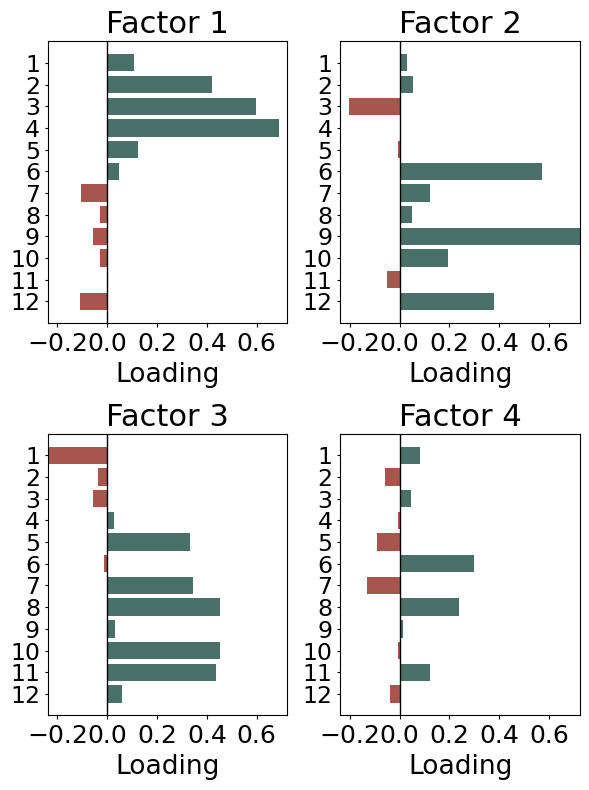

Variables in plot from TOP to BOTTOM (with numbers 12 to 1):
12. (logx+1)Pairs matching: Incorrect
11. (log)RT
10. (log)TMT: Duration alphabetic
9. (log)TMT: Duration numeric
8. SDS: Proportion correct
7. Picture vocab.: Specific cog. ability
6. Tower rearranging: Puzzles correct
5. PAL: Pairs correct
4. FIS
3. Matrix pattern: Number correct
2. Prospective memory: Initial
1. Numeric memory: Max digits correct


In [ ]:
# Loading plot
path = "/UK_BB/brainbody/cognition/code/efa_loadings/efa_loadings_renamed.xlsx"
df = pd.read_excel(path, sheet_name="Group_0")

# Extract variable names
variables = df["Variable"].astype(str).tolist()

# Extract the four components
components = ["PA1", "PA2", "PA3", "PA4"]
title_map = {'PA1': 'Factor 1',
             'PA2': 'Factor 2',
             'PA3': 'Factor 3',
             'PA4': 'Factor 4'}

label_map = {
    'Numeric memory: Maximum digits remembered correctly': 'Numeric memory: Max digits correct',
    'Prospective memory: Initial answer': 'Prospective memory: Initial',
    'Matrix pattern completion: Number of puzzles correct': 'Matrix pattern: Number correct',
    'Fluid intelligence score': 'FIS',
    'PAL: Number of correct pairs': 'PAL: Pairs correct',
    'Tower rearranging: Number of puzzles correct': 'Tower rearranging: Puzzles correct',
    'Picture vocabulary: Specific cognitive ability': 'Picture vocab.: Specific cog. ability',
    'Symbol digit substitution: Proportion of correct matches': 'SDS: Proportion correct',
    '(log)TMT: Duration to complete numeric path': '(log)TMT: Duration numeric',
    '(log)TMT: Duration to complete alphabetic path': '(log)TMT: Duration alphabetic',
    '(log)Reaction time': '(log)RT',
    '(logx+1)Pairs matching: Incorrect matches': '(logx+1)Pairs matching: Incorrect'
}
renamed_variables = [label_map.get(v, v) for v in variables]

# 2x2 subplots
fig, axes = plt.subplots(2, 2, figsize=(6, 8), sharey=True)

# Flatten axes so we can iterate cleanly
axes = axes.flatten()

for ax, comp in zip(axes, components):
    loadings = df[comp].astype(float).tolist()
    colors = ["#4A7169" if v >= 0 else "#A8554E" for v in loadings]

    ax.barh(variables, loadings, color=colors)
    ax.axvline(0, color="black", linewidth=1)

    all_loadings = pd.concat([df[c] for c in components])
    xmin = all_loadings.min()
    xmax = all_loadings.max()
    ax.set_xlim(xmin, xmax)
    ax.xaxis.set_major_locator(MultipleLocator(0.2)) 

    ax.set_title(title_map[comp], fontsize=22)
    ax.set_yticks(range(len(variables)))

    # Position tick labels
    if ax in axes:
        ax.yaxis.set_ticks_position('left')
    ax.tick_params(length=3)
    ax.tick_params(axis='y', length=2)
    
    # Set y-tick labels to show 1-12 from top to bottom
    ax.set_yticklabels(range(12, 0, -1), fontsize=17)

    ax.tick_params(axis='x', labelsize=18)
    ax.set_xlabel("Loading", fontsize=19)

plt.tight_layout()
plt.savefig(os.path.join(fig_path, 'fig1-prep/Fig1b_g_loadings.svg'),
            bbox_inches="tight", 
            transparent=False, 
            facecolor="w", 
            edgecolor='w', 
            orientation='landscape',
            format='svg',
            dpi=300)
plt.show()

# Print variable names in the order they appear in the plot (top to bottom)
print("Variables in plot:")
print("=" * 60)
for i, var in enumerate(reversed(renamed_variables), 1):
    print(f"{13-i}. {var}")

## Figure 2

Body performance

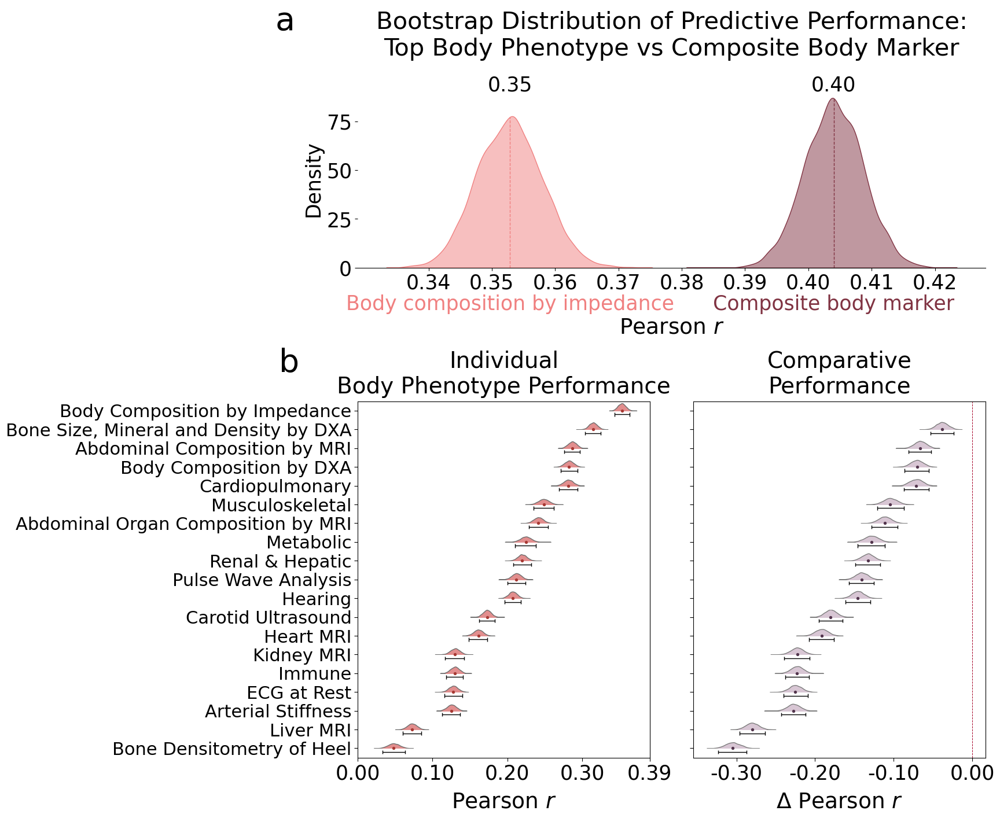

In [ ]:
# KDE plot: Body composition by impedance vs composite body + Ridge plots for body performance
# First row: KDE plot (1/3 height), Second row: violin plots (2/3 height)
warnings.simplefilter(action='ignore', category=FutureWarning)

fig = plt.figure(figsize=(14, 15))
gs = fig.add_gridspec(2, 1, height_ratios=[1, 2], hspace=0.5)

# Top: KDE 
ax_kde = fig.add_subplot(gs[0])

# KDE plot data preparation
body_results_dir = '/UK_BB/brainbody/bootstrap/body/results'
file_impedance = 'body_composition_by_impedance_bootstrapped.csv'
modality_impedance = 'body_composition_by_impedance'

body_stacked_results_dir = '/UK_BB/brainbody/bootstrap/stack/scaled/results'
file_stack = 'body_bootstrapped_scaled.csv'
modality_stack = 'body'
df_impedance = pd.read_csv(os.path.join(body_results_dir, file_impedance))
df_stack = pd.read_csv(os.path.join(body_stacked_results_dir, file_stack))

# Extract r values
col_impedance = f'{modality_impedance}_r'
col_stack = f'{modality_stack}_r'

body_data = []
if col_impedance in df_impedance.columns:
    r_vals = pd.to_numeric(df_impedance[col_impedance], errors='coerce').dropna()
    body_data.extend([{'modality': modality_impedance, 'r': r} for r in r_vals])

if col_stack in df_stack.columns:
    r_vals_stack = pd.to_numeric(df_stack[col_stack], errors='coerce').dropna()
    body_data.extend([{'modality': modality_stack, 'r': r} for r in r_vals_stack])

# Create DataFrame
body_df = pd.DataFrame(body_data)

# Compute medians
median_impedance = body_df[body_df['modality'] == modality_impedance]['r'].median()
median_stack = body_df[body_df['modality'] == modality_stack]['r'].median()

# Plot KDE
kde_palette = {
    'body_composition_by_impedance': 'lightcoral',
    'body': '#803342FF'
}

sns.kdeplot(
    data=body_df, x="r", hue="modality",
    fill=True, common_norm=False, palette=kde_palette,
    alpha=.5, linewidth=1, ax=ax_kde
)

# Get KDE heights at median positions
r_impedance_vals = body_df[body_df['modality'] == modality_impedance]['r'].dropna()
r_stack_vals = body_df[body_df['modality'] == modality_stack]['r'].dropna()

kde_impedance = gaussian_kde(r_impedance_vals)
kde_stack = gaussian_kde(r_stack_vals)

# Evaluate KDE height at the median
y_impedance = kde_impedance(median_impedance)[0] 
y_stack = kde_stack(median_stack)[0]

# Draw short vertical lines within KDE height
ax_kde.plot([median_impedance, median_impedance], [0, y_impedance], 
            color='lightcoral', linestyle='--', linewidth=1)
ax_kde.plot([median_stack, median_stack], [0, y_stack], 
            color='#803342FF', linestyle='--', linewidth=1)

# Get current y-axis upper limit
y_max = ax_kde.get_ylim()[1]
x_offset = 0.0 
ax_kde.text(median_impedance + x_offset, y_max * 0.99, f'{median_impedance:.2f}', 
            color='black', fontsize=25, ha='center')
ax_kde.text(median_stack + x_offset, y_max * 0.99, f'{median_stack:.2f}', 
            color='black', fontsize=25, ha='center')

sns.despine(left=True, ax=ax_kde)
ax_kde.set_title("Bootstrap Distribution of Predictive Performance:\nTop Body Phenotype vs Composite Body Marker", 
                 fontsize=30, y=1.1, pad=20)
                 
# Add letter 'a' to top-left of KDE plot
ax_kde.text(-0.1, 1.47, 'a', transform=ax_kde.transAxes, 
            fontsize=40, va='top', ha='right') #fontweight='bold', 


ax_kde.set_xlabel("Pearson $r$", fontsize=27, labelpad=30)
ax_kde.set_ylabel("Density", fontsize=25)

# Adjust ticks
r_min, r_max = body_df['r'].min(), body_df['r'].max()
ax_kde.set_xticks(np.arange(round(r_min, 2), round(r_max + 0.01, 2), 0.01))
ax_kde.tick_params(axis='x', labelsize=25)
ax_kde.tick_params(axis='y', labelsize=25)

# Remove legend
ax_kde.legend_.remove()

# Add labels under KDE distributions
# Position labels at the bottom of the plot
y_pos = -ax_kde.get_ylim()[1] * 0.15  # Position below x-axis

# Add label for left distribution (body composition by impedance)
ax_kde.text(median_impedance, y_pos, "Body composition by impedance", color ='lightcoral',
            fontsize=25, ha='center', va='top', 
            transform=ax_kde.transData)

# Add label for right distribution (composite body marker)
ax_kde.text(median_stack, y_pos, "Composite body marker", color ='#803342FF',
            fontsize=25, ha='center', va='top', 
            transform=ax_kde.transData)

# Bottom: Violins
# Create two subplots for the bottom row
gs_bottom = gs[1].subgridspec(1, 2, width_ratios=[1, 1], wspace=0.15)
ax1 = fig.add_subplot(gs_bottom[0])  # Left violin plot
ax2 = fig.add_subplot(gs_bottom[1])  # Right violin plot

# Styling patterns for violin plots
violin_linewidth = 1
violin_cut = 0
violin_width = 0.8
median_marker_size = 8
median_color_left = '#A73933FF'
median_color_right = '#53354DFF'
violin_color_left = 'lightcoral'
violin_color_right = '#DBC3D6FF'

# Left: Individual body performance
results_dir = '/UK_BB/brainbody/bootstrap/body/results'

# Load files for left plot
files = sorted([f for f in os.listdir(results_dir) if f.endswith('_bootstrapped.csv')])
data_left = []

for file in files:
    modality = file.replace('_bootstrapped.csv', '')
    df = pd.read_csv(os.path.join(results_dir, file))

    col = f'{modality}_r'
    if col in df.columns:
        r_vals = pd.to_numeric(df[col], errors='coerce').dropna()
        data_left.extend([{'modality': modality, 'r': r} for r in r_vals])
    else:
        print(f'Warning: expected column "{col}" not found in "{file}". Skipping.')

df_left = pd.DataFrame(data_left)

if not df_left.empty:
    # Compute median r per modality and sort descending
    medians_left = df_left.groupby('modality')['r'].median().sort_values(ascending=False)
    order_left = medians_left.index.tolist()

    # Determine display names for y-ticks via modality_map
    if 'modality_map' in globals() and isinstance(modality_map, dict):
        yticklabels_left = [modality_map.get(m, m) for m in order_left]
    else:
        yticklabels_left = order_left

    # Create left plot with consistent styling
    sns.violinplot(
        data=df_left,
        x='r', y='modality',
        order=order_left,
        ax=ax1,
        color=violin_color_left,
        linewidth=violin_linewidth,
        cut=violin_cut,
        inner=None,
        width=violin_width
    )

    # Add median markers for all modalities
    for j, modality in enumerate(order_left):
        median_val = medians_left[modality]
        ax1.scatter(median_val, j, color=median_color_left, s=median_marker_size, zorder=5)

    # Style left axes

    x_tick_fontsize = 25
    xlabel_fontsize = 27
    suptitle_fontsize = 28

    for spine in ax1.spines.values():
        spine.set_visible(True)

    # x ticks
    #ax1.xaxis.set_major_locator(MultipleLocator(0.1))
    ax1.set_xlim(left=0)
    ax1.tick_params(axis='both', which='both', length=4)
    ax1.tick_params(axis='x', labelsize=x_tick_fontsize)
    ax1.set_xlabel('Pearson $r$', fontsize=xlabel_fontsize, labelpad=10)

    x_min1, x_max1 = ax1.get_xlim()
    x_min1 = round(x_min1, 2)
    x_max1 = round(x_max1, 2)
    
    # Create fixed tick positions: min, min+0.1, min+0.2, max
    tick_positions = [0, x_min1 + 0.1, x_min1 + 0.2, x_min1 + 0.3, x_max1]
    # Set fixed locator
    from matplotlib.ticker import FixedLocator
    ax1.xaxis.set_major_locator(FixedLocator(tick_positions))

    # y ticks
    ax1.set_ylabel('')
    ax1.set_yticks(range(len(order_left)))
    ax1.set_yticklabels(yticklabels_left, fontsize=22)
    ax1.set_title('Individual\nBody Phenotype Performance', fontsize=suptitle_fontsize, pad=10)

    # Add letter 'b' to top-left of left violin plot
    ax1.text(-0.2, 1.15, 'b', transform=ax1.transAxes, 
         fontsize=40, va='top', ha='right') #fontweight='bold', 

    # Add CIs for left plot
    performance_bootstrapping_path = '/UK_BB/brainbody/bootstrap/body'
    performance_results_dir = os.path.join(performance_bootstrapping_path, 'results')
    ci_file = os.path.join(performance_results_dir, 'combined_bootstrap_CI_results.csv')
    if os.path.exists(ci_file):
        ci_df = pd.read_csv(ci_file)
        ci_df_r = ci_df[ci_df['Metric'] == 'r']  # Only get r values
        for j, modality in enumerate(order_left):
            if modality in ci_df_r['Modality'].values:
                ci_row = ci_df_r[ci_df_r['Modality'] == modality].iloc[0]
                lower_ci = ci_row['CI_lower']
                upper_ci = ci_row['CI_upper']
                
                # Add horizontal error bars at the bottom of each violin
                ax1.hlines(y=j + 0.2, xmin=lower_ci, xmax=upper_ci, 
                          color='black', linewidth=1, zorder=6)
                # Add vertical dashes for CI endpoints
                ax1.vlines([lower_ci, upper_ci], ymin=j + 0.1, ymax=j + 0.3,
                          color='black', linewidth=1, zorder=6)
    
    # Clip violins to show only the TOP half for left plot
    xlim_left = ax1.get_xlim()
    violin_collections_left = [c for c in ax1.collections if isinstance(c, PolyCollection)]
    violin_collections_left = violin_collections_left[:len(order_left)]

    for j, coll in enumerate(violin_collections_left):
        rect = patches.Rectangle(
            (xlim_left[0], j - 0.4),
            xlim_left[1] - xlim_left[0],
            0.4 + 1e-9,
            transform=ax1.transData,
            facecolor='none',
            edgecolor='none',
            linewidth=0
        )
        rect.set_visible(False)          
        ax1.add_patch(rect)
        coll.set_clip_path(rect)

# Right: Delta (Body vs Top Body)
bootstrapping_path = '/UK_BB/brainbody/bootstrap/body'
delta_results_dir = os.path.join(bootstrapping_path, 'delta_results')

# Load delta results for right plot
delta_dfs = {}
if os.path.exists(delta_results_dir):
    delta_files = [f for f in os.listdir(delta_results_dir) if f.startswith('delta_') and f.endswith('.csv')]
    for f in delta_files:
        delta_dfs[f.replace('.csv', '')] = pd.read_csv(os.path.join(delta_results_dir, f))

# Prepare data for right plot
metric = 'delta_r'
all_data_right = []

for mod_name, df in delta_dfs.items():
    if metric in df.columns:
        comparison_name = mod_name.replace('delta_', '').replace('_vs_body_composition_by_impedance', '')
        comparison_name = modality_map.get(comparison_name, comparison_name)
        for val in df[metric]:
            all_data_right.append({'Comparison': comparison_name, 'Value': val})

if all_data_right:
    plot_df = pd.DataFrame(all_data_right)
    sorted_order_right = plot_df.groupby('Comparison')['Value'].median().sort_values().index
    
    medians_right = plot_df.groupby('Comparison')['Value'].median().sort_values(ascending=False)

    # Create right plot
    sns.violinplot(
        data=plot_df,
        x='Value',
        y='Comparison',
        order=sorted_order_right,
        ax=ax2,
        color=violin_color_right,
        linewidth=violin_linewidth,
        cut=violin_cut,
        inner=None,
        width=violin_width
    )
    
    # Add median markers
    for j, modality in enumerate(sorted_order_right):
        median_val = medians_right[modality]
        ax2.scatter(median_val, j, color=median_color_right, s=median_marker_size, zorder=5)

    ax2.axvline(x=0, color='#A50026FF', linestyle='--', linewidth=0.7)
    ax2.set_ylabel('')

    # x ticks
    ax2.set_xlabel('Δ Pearson $r$', fontsize=xlabel_fontsize, labelpad=10)
    #ax2.xaxis.set_major_locator(MultipleLocator(0.1))
    #ax2.set_xlim(left=0)
    ax2.tick_params(axis='both', which='both', length=4)
    ax2.tick_params(axis='x', labelsize=x_tick_fontsize)

    x_min2, x_max2 = ax2.get_xlim()
    x_min2 = round(x_min2, 2)
    x_max2 = round(x_max2, 2)

    # Create fixed tick positions: min, min+0.1, min+0.2, max
    tick_positions = tick_positions = [x_min2, # show x_min
    x_min2 + 0.1,
    x_min2 + 0.2,
    x_min2 + 0.3,
    round(x_max2, 2)]

    # Set fixed locator
    from matplotlib.ticker import FixedLocator
    #ax2.xaxis.set_major_locator(FixedLocator(tick_positions))
    def format_tick(x, pos):
        if abs(x) < 1e-6:
            return "0.00"
        return f"{x:.2f}"

    from matplotlib.ticker import FixedLocator, FuncFormatter
    ax2.xaxis.set_major_formatter(FuncFormatter(format_tick))

    ax2.tick_params(axis='x', labelsize=x_tick_fontsize)
    ax2.set_title('Comparative\nPerformance', fontsize=suptitle_fontsize, pad=10)
    
    # Add CIs for right plot
    delta_ci_file = os.path.join(delta_results_dir, 'delta_CI_results.csv')
    if os.path.exists(delta_ci_file):
        delta_ci_df = pd.read_csv(delta_ci_file)
        delta_ci_df_r = delta_ci_df[delta_ci_df['Metric'] == 'r'].reset_index(drop=True)
        
        # Create a reverse mapping from display names to original names
        reverse_modality_map = {v: k for k, v in modality_map.items()}
        
        for j, modality in enumerate(sorted_order_right):
            original_modality_name = reverse_modality_map.get(modality, modality)
            ci_modality_name = f"{original_modality_name} vs body_composition_by_impedance"
            
            if ci_modality_name in delta_ci_df_r['Modality'].values:
                ci_row = delta_ci_df_r[delta_ci_df_r['Modality'] == ci_modality_name].iloc[0]
                lower_ci = ci_row['CI_lower']
                upper_ci = ci_row['CI_upper']
                
                # Add horizontal error bars at the bottom of each violin
                ax2.hlines(y=j - 0.2, xmin=lower_ci, xmax=upper_ci, 
                          color='black', linewidth=1, zorder=6)
                # Add vertical dashes for CI endpoints
                ax2.vlines([lower_ci, upper_ci], ymin=j - 0.3, ymax=j - 0.1,
                          color='black', linewidth=1, zorder=6)
            else:
                print(f"NOT found: {ci_modality_name}")
    
    # Remove y-axis labels on the right plot but keep ticks
    ax2.set_yticks(range(len(sorted_order_right)))
    ax2.set_yticklabels([''] * len(sorted_order_right))
    
    # Control plot margins
    n_categories = len(sorted_order_right)
    ax2.set_ylim(-0.9, n_categories)

    # Clip violins for right plot
    xlim_right = ax2.get_xlim()
    violin_collections_right = [c for c in ax2.collections if isinstance(c, PolyCollection)]
    violin_collections_right = violin_collections_right[:len(sorted_order_right)]

    for j, coll in enumerate(violin_collections_right):
        rect = patches.Rectangle(
            (xlim_right[0], j),
            xlim_right[1] - xlim_right[0],
            0.4 + 1e-9,
            transform=ax2.transData,
            facecolor='none',
            edgecolor='none',
            linewidth=0
        )
        rect.set_visible(False)          
        ax2.add_patch(rect)
        coll.set_clip_path(rect)

# Adjust y-axis limits for violin plots to be consistent
max_categories = max(len(order_left), len(sorted_order_right))
ax1.set_ylim(-0.5, max_categories - 0.5)
ax2.set_ylim(-0.5, max_categories - 0.5)

# Adjust y-ticks
ax1.set_yticks(range(max_categories))
ax2.set_yticks(range(max_categories))

ax1.invert_yaxis()
save_fig(['png', 'svg'], os.path.join(fig_path, 'final/Fig2'))
plt.show()

# Figure 3

## Figure 3a

Pearson *r* colorbar

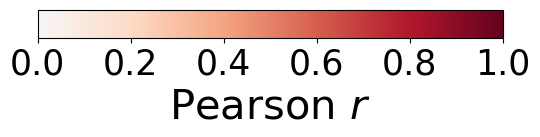

In [ ]:
# Normalize correlation values (0 to 1)
norm = colors.Normalize(vmin=0, vmax=1)

# Create a colormap that uses only the positive (blue) part of RdBu
# RdBu goes from red (0.0) to white (0.5) to blue (1.0)
positive_cmap = plt.colormaps['RdBu_r'].resampled(256)# Get the full colormap
# Extract only the second half
red_part = positive_cmap(np.linspace(0.5, 1, 256))
positive_cmap = colors.LinearSegmentedColormap.from_list('positive_rdbu', red_part)

# 1. Generate colorbar
fig, ax = plt.subplots(figsize=(6, 1))
fig.subplots_adjust(bottom=0.6)

from matplotlib.colorbar import ColorbarBase
cb1 = ColorbarBase(ax, cmap=positive_cmap, orientation='horizontal') #norm=norm, 
ticks = np.arange(0, 1.1, 0.2)
cb1.set_ticks(ticks)
cb1.set_ticklabels([f'{tick:.1f}' for tick in ticks])
cb1.ax.tick_params(labelsize=25)
cb1.set_label('Pearson $r$', fontsize=30)
plt.savefig(os.path.join(fig_path, 'colorbar_horizontal.svg'), dpi=300)

Correlation dots

In [ ]:
# Generate dot images
base_path = '/UK_BB/brainbody'
corr = pd.read_csv(os.path.join(base_path, 'feature_imp', 'feature_imp_body', 'combined', 'g_pred_from_body_mod_g_pred_stack_correlations.csv'))
for index, row in corr.iterrows():
    modality = row['Modality']
    r_value = row['Pearson r']
    
    # Use positive colormap
    color = positive_cmap(norm(r_value))

    fig, ax = plt.subplots(figsize=(1, 1))
    ax.add_patch(plt.Circle((0.5, 0.5), 0.4, color=color))
    ax.set_xlim(0, 1)
    ax.set_ylim(0, 1)
    ax.axis('off')

    # Clean filename
    filename = modality.lower().replace(' ', '_').replace('&', 'and').replace('(', '').replace(')', '').replace(',', '').replace('/', '_')
    filepath = os.path.join(fig_path, 'preps', 'body_performance', 'colorbar', 'positive', f'{filename}.png')
    plt.savefig(filepath, dpi=300, bbox_inches='tight', pad_inches=0, transparent=True)
    plt.close()

## Figure 3b

Scatterplots of predicted vs observed g

In [ ]:
# Scatterplots of predicted vs observed g: Config
bootstrapping_path = '/UK_BB/brainbody/bootstrap/stack'
modalities_to_plot = ['body', 'allmri', 'dwi', 'rs', 'smri', 'brain-body']

folds = range(0,5)
base_path = '/UK_BB/brainbody'
#base_path = 'Z:/IBu/UK_BB/brainbody'

dticmap = sns.light_palette("#0d648f", as_cmap=True)
rscmap = sns.light_palette("#4B6F5A99", as_cmap=True)
t1cmap = sns.light_palette("#f8b976", as_cmap=True)
stackcmap = sns.light_palette("#A73933FF", as_cmap=True)
bodycmap = sns.light_palette("#871C0FFF", as_cmap=True)
allmricmap = sns.light_palette("#6A659999", as_cmap=True)

modality_cmaps = {
    'dwi': dticmap,
    'rs': rscmap,
    'smri': t1cmap,
    'brain-body': stackcmap,
    'body': bodycmap,
    'allmri': allmricmap
}

modality_map = {
    'body': 'Composite Body',
    'allmri': 'Composite Brain', 
    'dwi': 'dwMRI',
    'rs': 'rsMRI',
    'smri': 'sMRI',
    'brain-body': 'Whole-Body'
}

# -----------------------
# Load precomputed performance metrics AND bootstrap confidence intervals
brain_metrics = pd.read_excel(os.path.join(base_path, r'result/2level/2level_result-mean_brain_stack.xlsx'))
body_metrics = pd.read_excel(os.path.join(base_path, r'result/2level/2level_result-mean_body_stack_outer.xlsx'))
brain_body_metrics = pd.read_excel(os.path.join(base_path, r'result/2level/2level_result-mean_brain_and_body_stack_outer.xlsx'))

# Load bootstrap confidence intervals
bootstrap_ci_path = '/UK_BB/brainbody/bootstrap/stack/scaled/results/combined_bootstrap_CI_results_stacked_sorted_scaled.xlsx'
bootstrap_df = pd.read_excel(bootstrap_ci_path)

# Combine into one master dataframe
all_metrics_df = pd.concat([brain_metrics, body_metrics, brain_body_metrics], ignore_index=True)

# Create comprehensive annotation dictionary with bootstrap CIs
annotation_metrics = {}

for _, row in all_metrics_df.iterrows():
    # Standardize modality names
    modality_key = row['Modality'].lower()
    
    # Replace specific patterns
    modality_key = modality_key.replace('3 brain mri modalities', 'allmri')
    modality_key = modality_key.replace('body physiology', 'body')
    modality_key = modality_key.replace('brain mri and body physiology', 'brain-body')
    modality_key = modality_key.replace('brain mri and body', 'brain-body')
    modality_key = modality_key.replace('dwmri', 'dwi')
    modality_key = modality_key.replace('rsmri', 'rs')
    modality_key = modality_key.replace('smri', 'smri')
    modality_key = modality_key.replace(' ', '-')
    
    # Store the main metrics
    annotation_metrics[modality_key] = {
        'r_value': row['Test Pearson r'],
        'r2_value': row['Test R2'],
        'r_ci_lower': None,
        'r_ci_upper': None,
        'r2_ci_lower': None,
        'r2_ci_upper': None
    }

# Add bootstrap confidence intervals
for _, row in bootstrap_df.iterrows():
    if row['Metric'] in ['R2', 'r']:
        # Standardize modality names to match
        modality_key = row['Modality'].lower()
        modality_key = modality_key.replace('3 brain mri modalities', 'allmri')
        modality_key = modality_key.replace('body physiology', 'body')
        modality_key = modality_key.replace('brain mri and body physiology', 'brain-body')
        modality_key = modality_key.replace('brain mri and body', 'brain-body')
        modality_key = modality_key.replace('dwmri', 'dwi')
        modality_key = modality_key.replace('rsmri', 'rs')
        modality_key = modality_key.replace('smri', 'smri')
        modality_key = modality_key.replace(' ', '-')
        
        if modality_key in annotation_metrics:
            if row['Metric'] == 'R2':
                annotation_metrics[modality_key]['r2_ci_lower'] = row['CI_lower']
                annotation_metrics[modality_key]['r2_ci_upper'] = row['CI_upper']
            elif row['Metric'] == 'r':
                annotation_metrics[modality_key]['r_ci_lower'] = row['CI_lower']
                annotation_metrics[modality_key]['r_ci_upper'] = row['CI_upper']

print("Loaded annotation metrics for modalities:")
for modality, metrics in annotation_metrics.items():
    print(f"  {modality}: r={metrics['r_value']:.3f}, R²={metrics['r2_value']:.3f}")
    if metrics['r_ci_lower'] is not None:
        print(f"    r CI: [{metrics['r_ci_lower']:.3f}, {metrics['r_ci_upper']:.3f}]")
    if metrics['r2_ci_lower'] is not None:
        print(f"    R² CI: [{metrics['r2_ci_lower']:.3f}, {metrics['r2_ci_upper']:.3f}]")

Loaded annotation metrics for modalities:
  allmri: r=0.477, R²=0.227
    r CI: [0.467, 0.486]
    R² CI: [0.218, 0.236]
  dwi: r=0.443, R²=0.171
    r CI: [0.433, 0.453]
    R² CI: [0.159, 0.183]
  rs: r=0.371, R²=0.128
    r CI: [0.360, 0.381]
    R² CI: [0.118, 0.138]
  smri: r=0.337, R²=0.098
    r CI: [0.326, 0.348]
    R² CI: [0.088, 0.108]
  body: r=0.400, R²=0.163
    r CI: [0.395, 0.413]
    R² CI: [0.131, 0.146]
  brain-body: r=0.470, R²=0.218
    r CI: [0.460, 0.477]
    R² CI: [0.176, 0.191]


In [ ]:
# Plotting function
def plot_modality_scatter(
    df, modality, save_dir=None,
    cmap_name='viridis', edge_color='white',
    marker_size=17, marker_alpha=0.6, line_lw=1.2, marker_linewidth=0.3,
    title_fontsize=30, label_fontsize=35, tick_fontsize=30,
    annotation_fontsize=None,
    add_grid=False,
    size=(6, 6)
):
    
    # Column names
    x_col = 'g_pred_stack_test'
    y_col = 'g_obs_test'
    for col in (x_col, y_col):
        if col not in df.columns:
            raise ValueError(f"Required column '{col}' not found in data for {modality}. "
                             f"Available columns: {df.columns.tolist()}")

    # Compute distance for color mapping (around the mean point)
    x = pd.to_numeric(df[x_col], errors='coerce').astype(float)
    y = pd.to_numeric(df[y_col], errors='coerce').astype(float)
    x_mean, y_mean = x.mean(), y.mean()
    dist_i = np.sqrt((y - y_mean)**2 + (x - x_mean)**2)

    # Prepare figure/axes
    fig, ax = plt.subplots(figsize=size)

    # Scatter with colormap (use matplotlib scatter for 'c' + 'cmap' support)
    sc = ax.scatter(
        x, y, c=dist_i, cmap=cmap_name,
        s=marker_size, alpha=marker_alpha,
        edgecolors=edge_color, linewidth=marker_linewidth
    )

    # Global regression line
    mask = np.isfinite(x) & np.isfinite(y)
    if mask.sum() >= 2:
        z = np.polyfit(x[mask], y[mask], 1)
        p = np.poly1d(z)
        # Sort x for a clean line
        xs = np.linspace(x[mask].min(), x[mask].max(), 200)
        ax.plot(xs, p(xs), alpha=0.8, linewidth=line_lw, color='#BE4A47FF', linestyle='-')

    # Initialize annotation variables with default values
    r_value = None
    r2_value = None
    r_ci_lower = None
    r_ci_upper = None
    r2_ci_lower = None
    r2_ci_upper = None
    annotation_text = "Default"

    # Get annotation metrics from the pre-loaded dictionary
    if modality in annotation_metrics:
        metrics = annotation_metrics[modality]
        r_value = metrics['r_value']
        r2_value = metrics['r2_value']
        r_ci_lower = metrics['r_ci_lower']
        r_ci_upper = metrics['r_ci_upper']
        r2_ci_lower = metrics['r2_ci_lower']
        r2_ci_upper = metrics['r2_ci_upper']
        
        # Create annotation text with confidence intervals
        if r_ci_lower is not None and r2_ci_lower is not None:
            annotation_text = (f'r = {r_value:.2f} [{r_ci_lower:.2f}, {r_ci_upper:.2f}]\n'
                              f'R² = {r2_value:.2f} [{r2_ci_lower:.2f}, {r2_ci_upper:.2f}]')
        else:
            # Fallback if CIs not available
            annotation_text = f'r = {r_value:.2f}\nR² = {r2_value:.2f}'
    else:
        print(f"Warning: No metrics found for modality '{modality}'")

    # Create annotation lines with proper error handling
    annotation_lines = []
    if r_value is not None and r_ci_lower is not None:
        #annotation_lines.append(rf'$r$ = {r_value:.2f}, 95% CI [{r_ci_lower:.2f}, {r_ci_upper:.2f}]')
        annotation_lines.append(rf'$r$ = {r_value:.2f}')
        annotation_lines.append(rf'95% CI [{r_ci_lower:.2f}, {r_ci_upper:.2f}]')
    elif r_value is not None:
        annotation_lines.append(rf'$r$ = {r_value:.2f}')

    # Aesthetics
    sns.despine(top=True, right=True, ax=ax)
    ax.set_xlabel('Predicted $g$-factor ($z$)', fontsize=label_fontsize)
    ax.set_ylabel('$g$-factor derived from ESEM ($z$)', fontsize=label_fontsize)
    ax.tick_params(axis='x', labelsize=tick_fontsize)
    ax.tick_params(axis='y', labelsize=tick_fontsize)

    # Title
    display_name = modality_map.get(modality, modality) if 'modality_map' in globals() else modality
    ax.set_title(display_name, fontsize=title_fontsize, y=1.14)

    # Side annotation (top-left inside axes) - Only add if we have metrics
    if annotation_lines:
        ax.text(
            0.05, 0.9, "\n".join(annotation_lines),
            transform=ax.transAxes, fontsize=annotation_fontsize,
            va='bottom', ha='left'
        )

    # Major tick spacing
    ax.xaxis.set_major_locator(MultipleLocator(1))
    ax.yaxis.set_major_locator(MultipleLocator(1.5))

    ax.set_xlim(-1.6, 1.5)
    ax.set_ylim(-3.5, 3)

    if add_grid:
        ax.grid(True, alpha=0.25)

    # Legend (only for lines)
    handles, labels = ax.get_legend_handles_labels()
    if handles:
        ax.legend(loc='lower right', fontsize=12)

    # Save and close
    plt.tight_layout()

    if save_dir is not None:
        out_path = os.path.join(save_dir, f'scatter_{modality}_vs_observed.png')
        plt.savefig(out_path, dpi=300, bbox_inches='tight')
        
    plt.show()
    plt.close()


Generating scatter plot for body...
Data shape for body: (31897, 4)
Columns: ['g_obs_test', 'eid', 'g_pred_stack_test', 'fold']


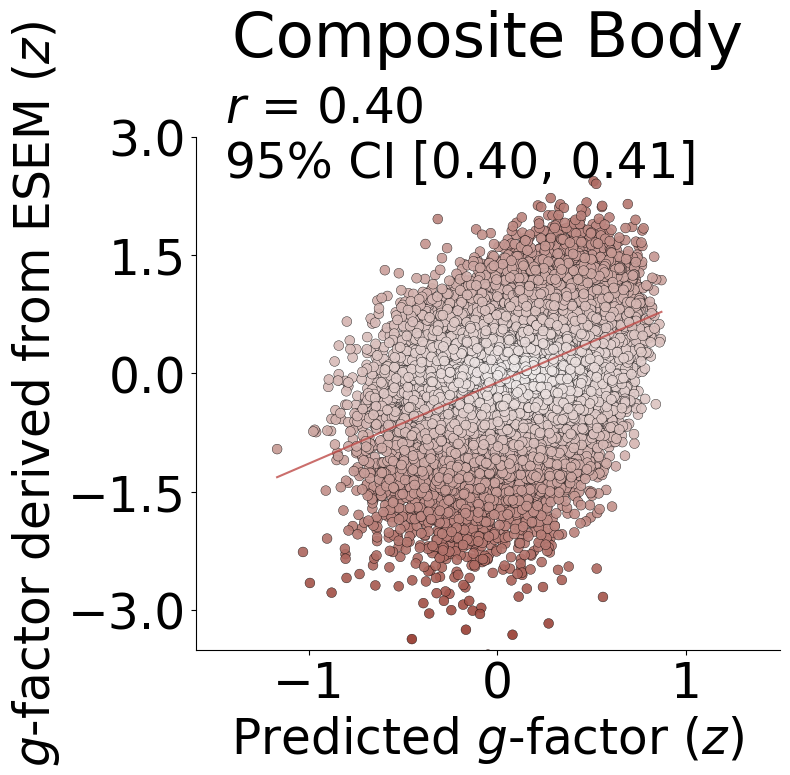

Successfully plotted body

Generating scatter plot for allmri...
Data shape for allmri: (25346, 4)
Columns: ['g_obs_test', 'eid', 'g_pred_stack_test', 'fold']


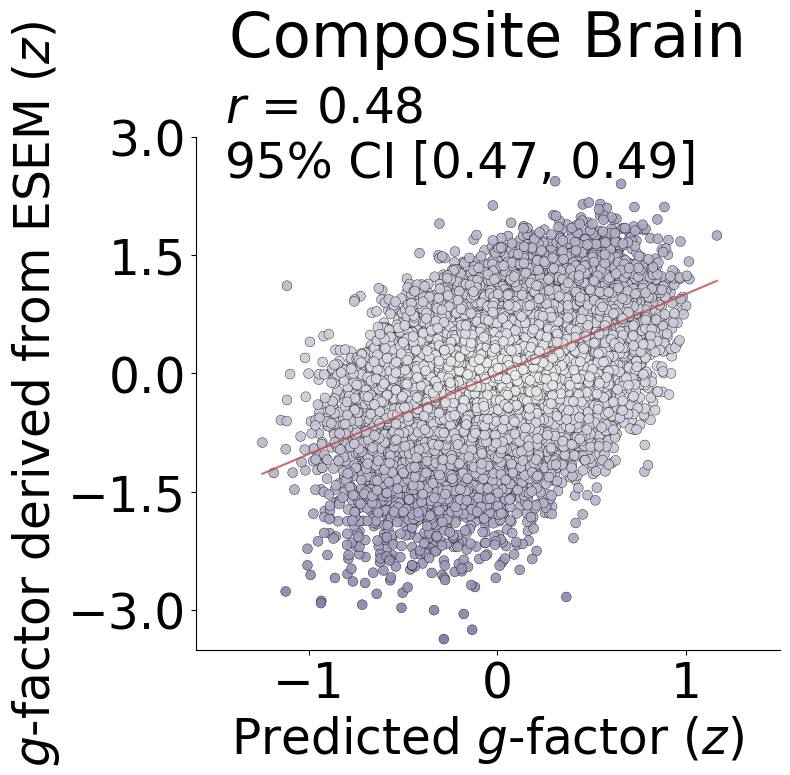

Successfully plotted allmri

Generating scatter plot for dwi...
Data shape for dwi: (25808, 4)
Columns: ['g_obs_test', 'eid', 'g_pred_stack_test', 'fold']


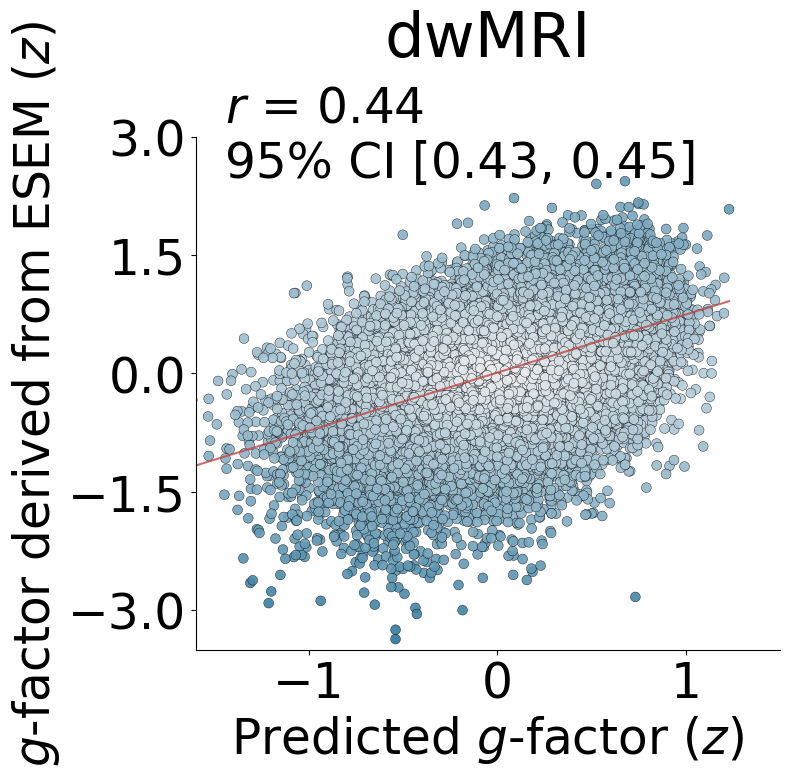

Successfully plotted dwi

Generating scatter plot for rs...
Data shape for rs: (25409, 4)
Columns: ['g_obs_test', 'eid', 'g_pred_stack_test', 'fold']


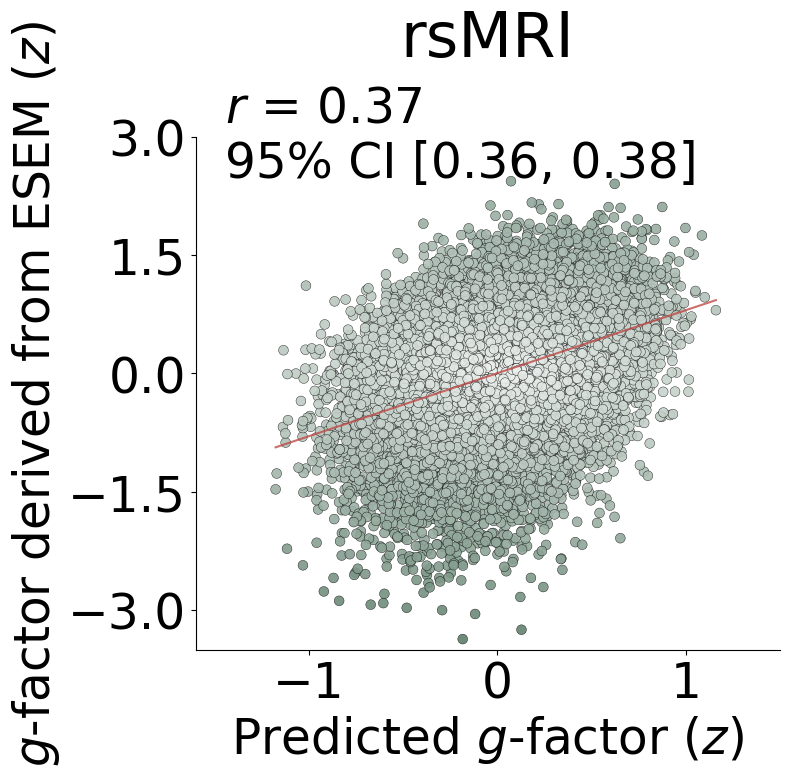

Successfully plotted rs

Generating scatter plot for smri...
Data shape for smri: (27125, 4)
Columns: ['g_obs_test', 'eid', 'g_pred_stack_test', 'fold']


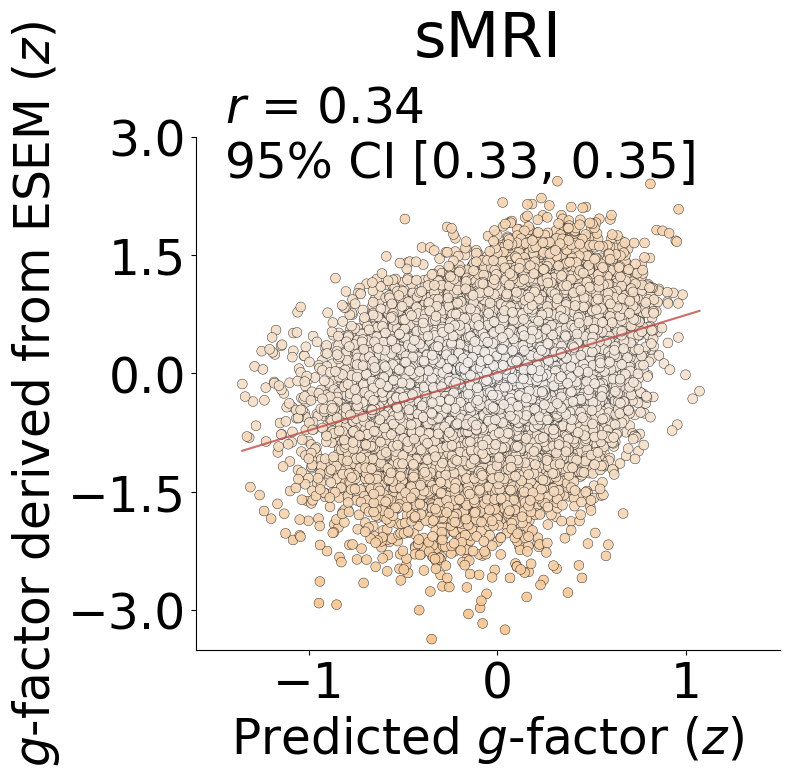

Successfully plotted smri

Generating scatter plot for brain-body...
Data shape for brain-body: (31897, 4)
Columns: ['g_obs_test', 'eid', 'g_pred_stack_test', 'fold']


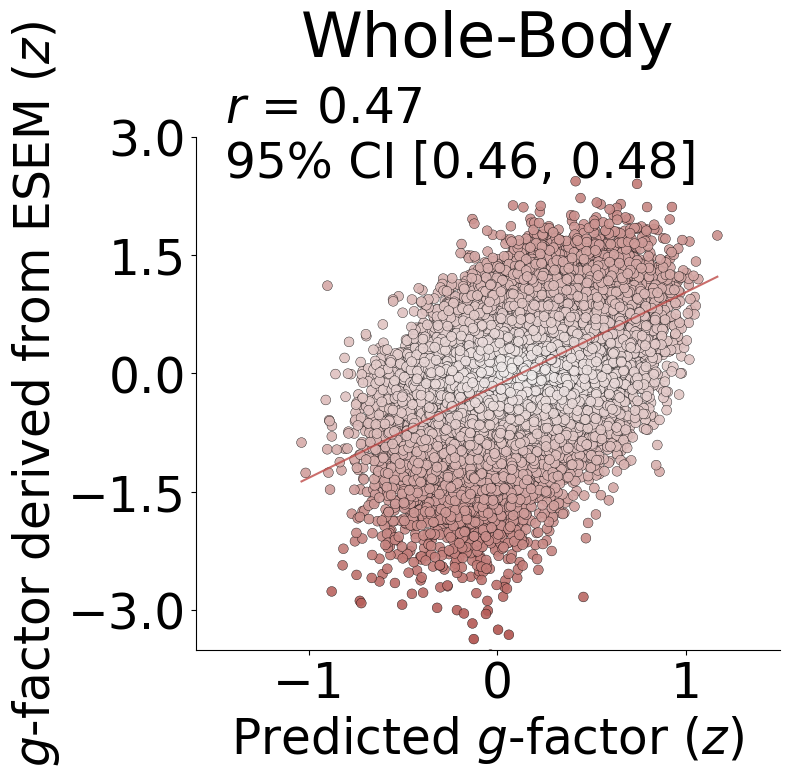

Successfully plotted brain-body

All scatter plots saved to: Z:\IBu\UK_BB\brainbody\figures


In [ ]:
# Plot scatterplots
modality_map = {
    'body': 'Composite Body',
    'allmri': 'Composite Brain', 
    'dwi': 'dwMRI',
    'rs': 'rsMRI',
    'smri': 'sMRI',
    'brain-body': 'Whole-Body'
}

# Set up the save directory for plots
scatter_save_dir = '/UK_BB/brainbody/figures'
# Set annotation fontsize
annotation_fontsize = 25

# Process and plot each modality
for modality in modalities_to_plot:
    print(f"\nGenerating scatter plot for {modality}...")
    
    try:
        # Load the combined test data for this modality
        input_path = os.path.join(bootstrapping_path, 'scaled', f'{modality}_folds_combined_test.csv')
        df = pd.read_csv(input_path)
        
        print(f"Data shape for {modality}: {df.shape}")
        print(f"Columns: {df.columns.tolist()}")
        
        # Check if required columns exist
        if 'g_obs_test' not in df.columns or 'g_pred_stack_test' not in df.columns:
            print(f"Warning: Required columns not found for {modality}. Skipping.")
            continue
            
        # Get the appropriate colormap
        cmap = modality_cmaps.get(modality, 'viridis')
        
        # Create the scatter plot
        plot_modality_scatter(
            df=df,
            modality=modality,
            save_dir=scatter_save_dir,
            cmap_name=cmap,
            edge_color='black',
            marker_size=50,
            marker_alpha=0.9,
            marker_linewidth=0.3,
            line_lw=1.5,
            title_fontsize=45,
            label_fontsize=35,
            tick_fontsize=35,
            annotation_fontsize=35,
            add_grid=False,
            size=(8, 8)  # Slightly larger for better visibility
        )
        
        print(f"Successfully plotted {modality}")
        
    except Exception as e:
        print(f"Error plotting {modality}: {str(e)}")
        import traceback
        traceback.print_exc()

print(f"\nAll scatter plots saved to: {scatter_save_dir}")

## Figure 3c

Body feature importance

In [ ]:
# Upload combined dataframe
base_path = '/UK_BB/brainbody'
output_path = os.path.join(base_path, 'feature_imp', 'feature_imp_body', 'combined')
combined = pd.read_csv(os.path.join(base_path, 'feature_imp/feature_imp_body/combined', 'body_features_g_pred_stack_combined.csv'))
corr_results = pd.read_csv(os.path.join(base_path, 'feature_imp/feature_imp_body/combined', 'body_features_g_pred_stack_correlations_detailed_sorted.csv'))

In [ ]:
# 1. Filter correlations
significant_correlations = corr_results[
    (corr_results['Pearson r'].abs() >= 0.198) & 
    (corr_results['p-value bonferroni'] < 0.05)
].copy()

print(f"Found {len(significant_correlations)} features with |r| >= 0.198")

#significant_correlations = corr_results.copy()

# Check if the renamed phenotypes exist in the Phenotype column
if 'Body mass index (BMI) (Musculoskeletal)' in significant_correlations['Phenotype'].values:
    print("Phenotype exists in results:")
    print(significant_correlations[significant_correlations['Phenotype'] == 'Body mass index (BMI) (Musculoskeletal)'])
else:
    print("Phenotype NOT found in results. Available phenotypes with 'BMI':")
    bmi_phenotypes = significant_correlations[significant_correlations['Phenotype'].str.contains('BMI', na=False)]
    for _, row in bmi_phenotypes.iterrows():
        print(f"  '{row['Phenotype']}': r = {row['Pearson r']:.3f}")

# 2. Identify which modality each feature belongs to 
modality_mapping = {}

# Rename
modality_suffix_map = {
    'body_composition_by_impedance': ' (Impedance)',
    'body_composition_dxa': ' (DXA)', 
    'musculoskeletal': ' (Musculoskeletal)',
    'cardiopulmonary': ' (Cardiopulmonary)',
    'arterial_stiffness': ' (Arterial Stiffness)'
}

duplicate_features_list = ['Trunk fat mass', 'Body mass index (BMI)', 'Weight', 'Pulse rate']

# Check one fold for each modality to get the feature names
for modality in modalities_body:
    try:
        # Load one fold's data for this modality
        fold = 0  # Use fold 0 as reference
        if modality == 'hearing':
            scaled_path = os.path.join(
                base_path,
                'hearing-vision',
                'folds',
                f'fold_{fold}',
                'scaling',
                f'{modality}_test_scaled_fold_{fold}.csv'
            )
        else:
            scaled_path = os.path.join(
                base_path,
                'body',
                'folds',
                f'fold_{fold}',
                'scaling',
                f'{modality}_test_scaled_fold_{fold}.csv'
            )
        
        # Load the modality features
        modality_df = pd.read_csv(scaled_path)
        modality_features = set(modality_df.columns)
        
        # Apply renaming to features
        if modality in modality_suffix_map:
            suffix = modality_suffix_map[modality]
            renamed_features = set()
            for feature in modality_features:
                if feature in duplicate_features_list:
                    renamed_features.add(f"{feature}{suffix}") #rename duplicate features
                else:
                    renamed_features.add(feature)
            modality_features = renamed_features
        
        # Store the features for this modality
        modality_mapping[modality] = modality_features
        print(f"Phenotype '{modality}' has {len(modality_features)} features")
        
    except Exception as e:
        print(f"Error loading modality {modality}: {e}")
        modality_mapping[modality] = set()

# Create reverse mapping for debugging
feature_to_modalities = {}
for modality, features in modality_mapping.items():
    for feature in features:
        if feature not in feature_to_modalities:
            feature_to_modalities[feature] = []
        feature_to_modalities[feature].append(modality)

# Check for duplicates (should be NONE now)
duplicate_features = {f: mods for f, mods in feature_to_modalities.items() if len(mods) > 1}
if duplicate_features:
    print(f"\nFound {len(duplicate_features)} features in multiple modalities:")
    for feature, mods in list(duplicate_features.items())[:5]:
        print(f"  '{feature}': {mods}")
else:
    print(f"\nNo duplicate features found - all duplicates have been renamed!")

# 3 Check the distribution of modalities among significant features
def find_feature_modality(feature_name):
    """Find which modality a feature belongs to"""
    for modality, features in modality_mapping.items():
        if feature_name in features:
            return modality
    return 'unknown'  # If not found in any modality

significant_correlations['domain'] = significant_correlations['Phenotype'].apply(find_feature_modality)

# Check how many features map to each domain
print("\nDomain distribution:")
domain_counts = significant_correlations['domain'].value_counts()
print(domain_counts)

# Check for unknown modalities
unknown_features = significant_correlations[significant_correlations['domain'] == 'unknown']
if len(unknown_features) > 0:
    print(f"\nWarning: {len(unknown_features)} features could not be mapped to a modality:")
    for feature in unknown_features['Phenotype']:
        print(f"  - {feature}")
        
        # Debug: Check why this feature isn't found
        found_in = []
        for modality, features in modality_mapping.items():
            if feature in features:
                found_in.append(modality)
        if found_in:
            print(f"     Actually found in: {found_in}")
        else:
            print(f"     Not found in any modality set")
else:
    print("\nAll features successfully mapped to modalities")

# Check how many unique domains we have
unique_domains = significant_correlations['domain'].nunique()
print(f"\nUnique domains found: {unique_domains}")
print(f"Total features: {len(significant_correlations)}")

# 4 Add modality information to significant correlations
significant_correlations['domain'] = significant_correlations['Phenotype'].apply(find_feature_modality)

# Check for unknown modalities
unknown_features = significant_correlations[significant_correlations['domain'] == 'unknown']
if len(unknown_features) > 0:
    print(f"\nWarning: {len(unknown_features)} features could not be mapped to a modality:")
    for feature in unknown_features['Phenotype']:
        print(f"  - {feature}")
else:
    print("\nAll features successfully mapped to modalities")
print(f"\nUnique domains found: {significant_correlations['domain'].nunique()}")
print(f"Total features: {len(significant_correlations)}")


# 5. Create the final mapping dataframe with sex-stratified data using Bonferroni correction
domain_corr_df = significant_correlations.rename(columns={
    'Phenotype': 'feature',
    'Pearson r': 'correlation',
    'p-value': 'p_value'
}).copy()

# Add sex-stratified columns (using Bonferroni-corrected p-values)
domain_corr_df['Pearson r male'] = significant_correlations['Pearson r male']
domain_corr_df['Pearson r female'] = significant_correlations['Pearson r female']
domain_corr_df['p_value_male'] = significant_correlations['p-value male bonferroni']  # Use Bonferroni-corrected
domain_corr_df['p_value_female'] = significant_correlations['p-value female bonferroni']  # Use Bonferroni-corrected

# Add significance flags for each sex using BONFERRONI CORRECTION (p < 0.05 after correction)
domain_corr_df['significant_male'] = domain_corr_df['p_value_male'] < 0.05
domain_corr_df['significant_female'] = domain_corr_df['p_value_female'] < 0.05

# Keep the overall significance (using Bonferroni-corrected)
domain_corr_df['p_value_overall_bonferroni'] = significant_correlations['p-value bonferroni']
domain_corr_df['significant'] = domain_corr_df['p_value_overall_bonferroni'] < 0.05

print(f"\nFinal domain mapping with Bonferroni-corrected sex-stratified data:")
print(domain_corr_df[['feature', 'correlation', 'domain', 'significant_male', 'significant_female']].head())

# Show summary of significant features
print(f"\nSignificant features summary:")
print(f"Significant in males: {domain_corr_df['significant_male'].sum()}")
print(f"Significant in females: {domain_corr_df['significant_female'].sum()}")
print(f"Significant in either sex: {(domain_corr_df['significant_male'] | domain_corr_df['significant_female']).sum()}")

# Save the mapping
mapping_output_path = os.path.join(base_path, 'feature_imp', 'feature_imp_body', 'combined', 'body_features_domain_mapping_sex_stratified_bonferroni.csv')
domain_corr_df.to_csv(mapping_output_path, index=False)
print(f"\nDomain mapping saved to: {mapping_output_path}")

# Show summary by domain
print("\nSummary by domain (Bonferroni-corrected):")
domain_summary = domain_corr_df.groupby('domain').agg({
    'feature': 'count',
    'correlation': ['mean', 'min', 'max'],
    'significant_male': 'sum',
    'significant_female': 'sum'
}).round(3)
print(domain_summary)

# 6 Create domain order
domain_order = [
    'body_composition_by_impedance',
    'bone_dxa',
    'abdominal_composition_mri_18_vars',
    'body_composition_dxa',
    'cardiopulmonary',
    'musculoskeletal',
    'abdominal_organ_composition_mri_13_vars',
    'metabolic',
    'renalhepatic',
    'pwa',
    'hearing',
    'carotid_ultrasound',
    'heart_mri',
    'kidneys_mri',
    'immune',
    'arterial_stiffness',
    'ecg_rest',
    'liver_mri',
    'bone_densitometry',
]
#sorted(domain_corr_df['domain'].unique())

# Create a mapping of domain to y-position groups
domain_groups = {}
for i, domain in enumerate(domain_order):
    domain_groups[domain] = i

# Assign y-position based on domain
domain_corr_df['domain_order'] = domain_corr_df['domain'].map(domain_groups)

Found 77 features with |r| >= 0.198
Phenotype NOT found in results. Available phenotypes with 'BMI':
Phenotype 'immune' has 32 features
Phenotype 'renalhepatic' has 16 features
Phenotype 'metabolic' has 14 features
Phenotype 'cardiopulmonary' has 7 features
Phenotype 'musculoskeletal' has 13 features
Phenotype 'bone_densitometry' has 4 features
Phenotype 'pwa' has 18 features
Phenotype 'heart_mri' has 8 features
Phenotype 'carotid_ultrasound' has 12 features
Phenotype 'arterial_stiffness' has 4 features
Phenotype 'ecg_rest' has 9 features
Phenotype 'body_composition_by_impedance' has 32 features
Phenotype 'body_composition_dxa' has 43 features
Phenotype 'bone_dxa' has 68 features
Phenotype 'kidneys_mri' has 4 features
Phenotype 'liver_mri' has 2 features
Phenotype 'abdominal_composition_mri_18_vars' has 17 features
Phenotype 'abdominal_organ_composition_mri_13_vars' has 12 features
Phenotype 'hearing' has 2 features
/nNo duplicate features found - all duplicates have been renamed!
/nDo

In [32]:
# Rename features
feature_rename_map = {
'L1-L4 average height': 'L1-L4 average height',
'Forced expiratory volume (FEV1)': 'FEV1',
'Sitting height': 'Sitting height',
'Standing height': 'Standing height',
'Seated height': 'Seated height',
'Forced vital capacity (FVC)': 'FVC',
'Height': 'Height',
'Anterior thigh fat-free muscle volume (left)': 'Anterior thigh fat-free muscle vol (left)',
'Femur wards BMD (bone mineral density) T-score (right)': 'Femur wards BMD T-score (right)',
'Anterior thigh fat-free muscle volume (right)': 'Anterior thigh fat-free muscle vol (right)',
'Head BMC (bone mineral content)': 'Head BMC',
'IGF-1': 'IGF-1',
'Peak expiratory flow (PEF)': 'PEF',
'Head bone area': 'Head bone area',
'Femur wards BMD (bone mineral density) T-score (left)': 'Femur wards BMD T-score (left)',
'Femur wards BMD (bone mineral density) (right)': 'Femur wards BMD (right)',
'Femur wards BMD (bone mineral density) (left)': 'Femur wards BMD (left)',
'Femur neck BMD (bone mineral density) T-score (left)': 'Femur neck BMD T-score (left)',
'Total BMD (bone mineral density) T-score': 'Total BMD T-score',
'Femur neck BMD (bone mineral density) T-score (right)': 'Femur neck BMD T-score (right)',
'Total thigh fat-free muscle volume': 'Total thigh fat-free muscle vol',
'Pancreas volume': 'Pancreas volume',
'Handgrip strength': 'Handgrip strength',
'Femur neck BMD (bone mineral density) (left)': 'Femur neck BMD (left)',
'Left kidney volume': 'Left kidney volume',
'Femur neck BMD (bone mineral density) (right)': 'Femur neck BMD (right)',
'Pelvis BMD (bone mineral density)': 'Pelvis BMD',
'Posterior thigh fat-free muscle volume (right)': 'Posterior thigh fat-free muscle vol (right)',
'Posterior thigh fat-free muscle volume (left)': 'Posterior thigh fat-free muscle vol (left)',
'Gynoid lean mass': 'Gynoid lean mass',
'Gynoid fat free mass': 'Gynoid fat free mass',
'Mean arterial pressure during PWA': 'Mean arterial pressure during PWA',
'Total trunk fat volume': 'Total trunk fat volume',
'Trunk fat percentage': 'Trunk fat percentage',
'Minimum carotid IMT (intima-medial thickness) at 120 degrees ': 'Minimum carotid IMT at 120°',
'Minimum carotid IMT (intima-medial thickness) at 150 degrees ': 'Minimum carotid IMT at 150°',
'Speech-reception-threshold (SRT) estimate (right)': 'SRT estimate (right)',
'Total tissue fat percentage': 'Total tissue fat percentage',
'Waist circumference': 'Waist circumference',
'Speech-reception-threshold (SRT) estimate (left)': 'SRT estimate (left)',
'Alkaline phosphatase': 'Alkaline phosphatase',
'Stroke volume during PWA': 'Stroke volume during PWA',
'Maximum carotid IMT (intima-medial thickness) at 210 degrees ': 'Maximum carotid IMT at 210°',
'Mean carotid IMT (intima-medial thickness) at 210 degrees ': 'Mean carotid IMT at 210°',
'Mean carotid IMT (intima-medial thickness) at 240 degrees ': 'Mean carotid IMT at 240°',
'Maximum carotid IMT (intima-medial thickness) at 150 degrees ': 'Maximum carotid IMT at 150°',
'Maximum carotid IMT (intima-medial thickness) at 240 degrees ': 'Maximum carotid IMT at 240°',
'End systolic pressure during PWA': 'End systolic pressure during PWA',
'Mean carotid IMT (intima-medial thickness) at 150 degrees ': 'Mean carotid IMT at 150°',
'Maximum carotid IMT (intima-medial thickness) at 120 degrees ': 'Maximum carotid IMT at 120°',
'Glycated haemoglobin (HbA1c)': 'Glycated haemoglobin (HbA1c)',
'Mean carotid IMT (intima-medial thickness) at 120 degrees ': 'Mean carotid IMT at 120°',
'Central augmentation pressure during PWA': 'Central augmentation pressure during PWA',
'Cardiac index during PWA': 'Cardiac index during PWA',
'Cardiac output during PWA': 'Cardiac output during PWA',
'Trunk tissue fat percentage': 'Trunk tissue fat percentage',
'Android tissue fat percentage': 'Android tissue fat percentage',
'Visceral adipose tissue volume (VAT)': 'VAT vol',
'Peripheral pulse pressure during PWA': 'Peripheral pulse pressure during PWA',
'Systolic brachial blood pressure during PWA': 'Systolic brachial BP during PWA',
'Systolic brachial blood pressure': 'Systolic brachial BP',
'Visceral fat volume': 'Visceral fat vol',
'Total abdominal adipose tissue index': 'Total abdominal adipose tissue index',
'VAT (visceral adipose tissue) mass': 'VAT mass',
'VAT (visceral adipose tissue) volume': 'VAT vol',
'Central systolic blood pressure during PWA': 'Central systolic blood pressure during PWA',
'Central pulse pressure during PWA': 'Central pulse pressure during PWA',
'Weight-to-muscle ratio': 'Weight-to-muscle ratio',
'Pancreas PDFF (fat fraction)': 'Pancreas PDFF (fat fraction)',
'Cystatin C': 'Cystatin C',
'Systolic blood pressure': 'Systolic BP',
'Abdominal fat ratio': 'Abdominal fat ratio',
'Posterior thigh muscle fat infiltration (MFI) (left)': 'Posterior thigh MFI (left)',
'Posterior thigh muscle fat infiltration (MFI) (right)': 'Posterior thigh MFI (right)',
'Anterior thigh muscle fat infiltration (MFI) (right)': 'Anterior thigh MFI (right)',
'Anterior thigh muscle fat infiltration (MFI) (left)': 'Anterior thigh MFI (left)',
'Muscle fat infiltration': 'Muscle fat infiltration',
}

# Apply renaming to Phenotype column
domain_corr_df['feature'] = domain_corr_df['feature'].map(feature_rename_map).fillna(domain_corr_df['feature'])
for i, (orig, new) in enumerate(zip(domain_corr_df['feature'], domain_corr_df['feature'])):
    if orig != new:
        print(f"'{orig}' -> '{new}'")

Splitting at index 40, between domains 'cardiopulmonary' and 'musculoskeletal'
Left plot: 40 features, Right plot: 37 features
Creating left subplot...
Creating right subplot...


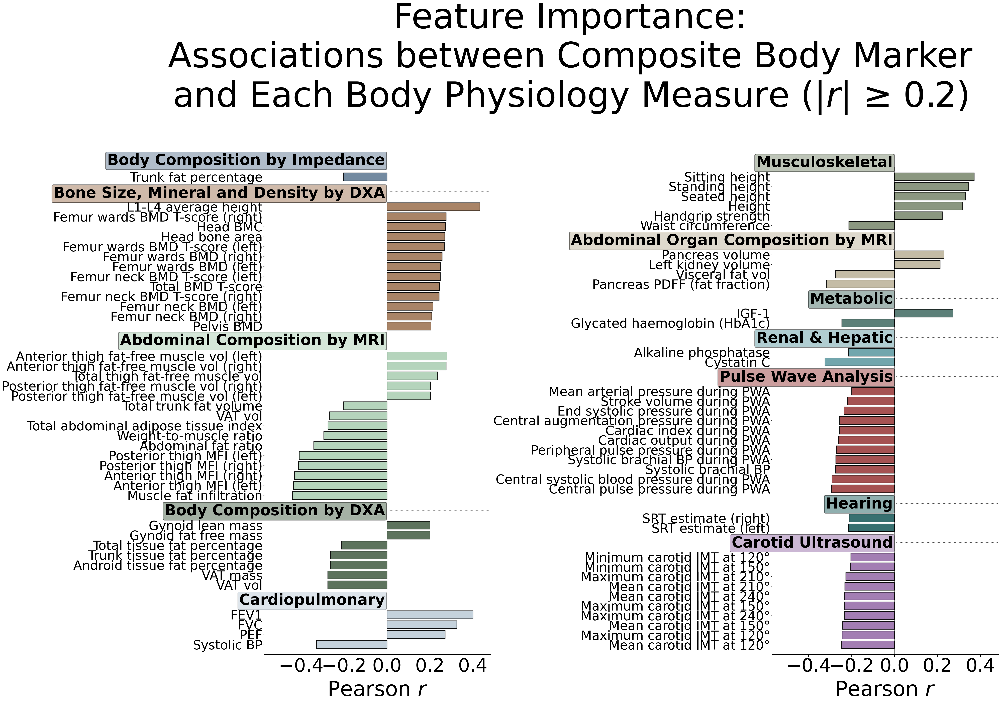

Figure saved with 40 features in left plot and 37 features in right plot


In [ ]:
# Vertical feature importance plot
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(60, 40),
                                gridspec_kw={'width_ratios': [1, 1]})

# Sort by domain and then by correlation
significant_df = domain_corr_df.sort_values(['domain_order', 'correlation'], ascending=[True, False])
significant_df = significant_df.reset_index(drop=True)

# Determine split point
total_features = len(significant_df)
split_idx = int(total_features / 2)

# Find the nearest domain boundary for a clean split
for i in range(split_idx, total_features):
    if i == 0 or i == total_features:
        continue
    prev_domain = significant_df.iloc[i-1]['domain']
    curr_domain = significant_df.iloc[i]['domain']
    if curr_domain != prev_domain:
        split_idx = i
        print(f"Splitting at index {split_idx}, between domains '{prev_domain}' and '{curr_domain}'")
        break

# Split the dataframe
df_left = significant_df.iloc[:split_idx].copy()
df_right = significant_df.iloc[split_idx:].copy()

print(f"Left plot: {len(df_left)} features, Right plot: {len(df_right)} features")

# Function to create a vertical bar plot
def create_vertical_subplot(ax, data_df, subplot_label=None, ylabel_fontsize=None):
    """Create a vertical bar plot on given axes"""
    
    # Create y positions with spacing between domains
    y_positions = []
    current_domain = None
    spacing = 2.0
    position = 0
    
    for i in range(len(data_df)):
        domain = data_df.iloc[i]['domain']
        if domain != current_domain and current_domain is not None:
            position += spacing
        y_positions.append(position)
        position += 1
        current_domain = domain
    
    y_positions = np.array(y_positions)
    bar_height = 0.8
    
    # Define color palette
    custom_palette = [
        "#A07756FF", '#BFCDD9FF', '#7F8C72FF', '#ADD0B5FF', 
        '#4A7169FF', '#BEB59CFF', '#4B644BFF', "#9B3F3FFF", 
        '#647D96FF', "#9970ABFF", '#226060FF', '#639CA4FF',
        "#26588AFF", '#D2AD7CFF', "#2A775CFF","#C28C5FFF",
        '#F4A582FF', "#B8858EFF", '#846D86FF'
    ]
    
    palette_dict = dict(zip(domain_corr_df['domain'].unique(), custom_palette))
    
    # Create vertical bar plot
    for i, (idx, row) in enumerate(data_df.iterrows()):
        color = palette_dict[row['domain']]
        ax.barh(y_positions[i], row['correlation'], height=bar_height, 
                color=color, alpha=0.9, edgecolor='black', linewidth=2.5)
    
    # Add zero reference line
    ax.axvline(x=0, color='grey', linewidth=3, linestyle='-', zorder=0)
    
    # Set x-axis limits
    max_corr = max(data_df['correlation'].max(), abs(data_df['correlation'].min()))
    ax.set_xlim(-max_corr*1, max_corr*1)
    ax.xaxis.set_major_locator(ticker.MultipleLocator(0.2))
    
    # Manual domain offsets
    domain_offset_overrides = {
        'body_composition_by_impedance': (-max_corr * 0.02, -1.6),  
        'bone_dxa': (-max_corr * 0.02, -1.3),
        'abdominal_composition_mri_18_vars': (-max_corr * 0.02, -1.5), 
        'body_composition_dxa': (-max_corr * 0.02, -1.4),
        'cardiopulmonary': (-max_corr * 0.02, -1.4),
        'musculoskeletal': (-max_corr * 0.02, -1.4),
        'abdominal_organ_composition_mri_13_vars': (-max_corr * 0.02, -1.4),
        'metabolic': (-max_corr * 0.02, -1.4),
        'renalhepatic': (-max_corr * 0.02, -1.4),
        'pwa': (-max_corr * 0.02, -1.4),
        'hearing': (-max_corr * 0.02, -1.4),
        'carotid_ultrasound': (-max_corr * 0.02, -1.4)
    }
    
    # Initialize domain_offsets dictionary
    domain_offsets = {}
    current_domain = None
    domain_start_idx = 0
    
    # Process each row to calculate offsets
    for i in range(len(data_df)):
        domain = data_df.iloc[i]['domain']
        if domain != current_domain:
            if current_domain is not None:
                # Use manual override if defined, otherwise use default
                if current_domain in domain_offset_overrides:
                    x_offset, y_offset = domain_offset_overrides[current_domain]
                else:
                    # Default offsets for domains not in overrides
                    x_offset = -max_corr * 0.15  # Default horizontal
                    y_offset = -0.2              # Default vertical
                
                # Store the calculated offset
                domain_offsets[current_domain] = (x_offset, y_offset)
            
            domain_start_idx = i
            current_domain = domain
    
    # Handle the last domain
    if current_domain is not None:
        if current_domain in domain_offset_overrides:
            x_offset, y_offset = domain_offset_overrides[current_domain]
        else:
            # Default offsets for domains not in overrides
            x_offset = -max_corr * 0.15
            y_offset = -0.2
        
        domain_offsets[current_domain] = (x_offset, y_offset)
    
    # Add domain annotations using the calculated offsets
    current_domain = None
    domain_start_idx = 0
    
    for i in range(len(data_df)):
        domain = data_df.iloc[i]['domain']
        if domain != current_domain:
            if current_domain is not None:
                x_offset, y_offset = domain_offsets.get(current_domain, (-max_corr * 0.15, -0.2))
                annotation_y = y_positions[domain_start_idx] + y_offset
                
                ax.text(x_offset, annotation_y, modality_map[current_domain],
                        ha='right', va='center', fontsize=65, fontweight='bold', rotation=0,
                        bbox=dict(boxstyle="round,pad=0.1", facecolor=palette_dict[current_domain], alpha=0.5, linewidth=3))
            
            domain_start_idx = i
            current_domain = domain
    
    # Add annotation for the very last domain
    if current_domain is not None:
        x_offset, y_offset = domain_offsets.get(current_domain, (-max_corr * 0.15, -0.2))
        annotation_y = y_positions[domain_start_idx] + y_offset
        
        ax.text(x_offset, annotation_y, modality_map[current_domain],
                ha='right', va='center', fontsize=65, fontweight='bold', rotation=0,
                bbox=dict(boxstyle="round,pad=0.1", facecolor=palette_dict[current_domain], alpha=0.5))
    
    # Add separation lines between domains
    current_domain = None
    for i in range(len(data_df)):
        domain = data_df.iloc[i]['domain']
        if domain != current_domain:
            if current_domain is not None:
                gap_center = (y_positions[i-1] + y_positions[i]) / 2
                ax.axhline(y=gap_center, color='black', xmin=0.55, xmax=1.0, linestyle=':', alpha=0.7, linewidth=2)
            current_domain = domain
    
    # Set y-axis limits and labels
    ax.set_ylim(y_positions[0] - 1, y_positions[-1] + 1)
    ax.set_yticks(y_positions)
    ax.set_yticklabels(data_df['feature'].tolist(), fontsize=ylabel_fontsize)
    
    # Customize axes
    ax.tick_params(axis='x',
            labelsize=80,
            bottom=True,     # bottom ticks
            length=10,
            width=2,
            color='black')
    ax.set_xlabel("Pearson $r$", fontsize=90, labelpad=20)
    
    # Customize spines
    ax.spines['left'].set_linewidth(0)
    ax.spines['bottom'].set_linewidth(2)
    ax.spines['top'].set_linewidth(0)
    ax.spines['right'].set_linewidth(0)
    
    # Invert y-axis
    ax.invert_yaxis()
    
    # Add subplot label (A, B)
    if subplot_label:
        ax.text(0.02, 0.98, subplot_label, transform=ax.transAxes, 
                fontsize=44, fontweight='bold', va='top',
                bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))
    
    return max_corr

# Create left subplot
print("Creating left subplot...")
max_corr_left = create_vertical_subplot(ax1, df_left, subplot_label=None, ylabel_fontsize=55)

# Create right subplot  
print("Creating right subplot...")
max_corr_right = create_vertical_subplot(ax2, df_right, subplot_label=None, ylabel_fontsize=55)

# Ensure both plots have consistent x-axis limits for comparison
max_corr_both = max(max_corr_left, max_corr_right)
ax1.set_xlim(-max_corr_both*1.3, max_corr_both*1.1)
ax2.set_xlim(-max_corr_both*1.3, max_corr_both*1.1)


# Share y-axis scale
# ax1.sharey(ax2)

fig.suptitle('Feature Importance:\nAssociations between Composite Body Marker\nand Each Body Physiology Measure (|$r$| ≥ 0.2)', 
            fontsize=150,
            #fontweight='bold',
            y=1.05,
            x=0.57,
            verticalalignment='top')

# Adjust tight_layout to make space for title
plt.tight_layout(rect=[0, 0, 1, 0.96])  # Leave top 4% for title

# Adjust layout
plt.tight_layout()

# Save the figure
plt.savefig(os.path.join(fig_path, 'Fig3c_body_features_g_pred_stack_annotated_split_vertical.svg'),
            bbox_inches="tight", 
            pad_inches=1, 
            transparent=False, 
            facecolor="w", 
            edgecolor='w', 
            format='svg',
            dpi=300)

plt.show()
print(f"Figure saved with {len(df_left)} features in left plot and {len(df_right)} features in right plot")

# Figure 4

## Figure 4a

Composite body performance versus brain and whole-body markers

In [ ]:
# Prepare data for KDE plot of delta_r values
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)

bootstrapping_path = '/UK_BB/brainbody/bootstrap/body_vs_all'
delta_dfs = {}
delta_dir_stacked = os.path.join(bootstrapping_path, 'delta_results_stacked')
if os.path.exists(delta_dir_stacked):
    delta_files = [f for f in os.listdir(delta_dir_stacked) if f.startswith('delta_') and f.endswith('.csv')]
    for f in delta_files:
        delta_dfs[f.replace('.csv', '')] = pd.read_csv(os.path.join(delta_dir_stacked, f))


kde_palette = {
    'dwMRI': '#0d648f',
    'rsMRI': '#4B6F5A99', 
    'sMRI': '#f8b976',
    '3 Brain MRI Modalities': '#6A659999',
    '3 Brain MRI Modalities and Body': '#A73933FF'
}

combined_data = []
delta_modality_mapping = {
    'delta_dwi_vs_body': 'dwMRI',
    'delta_rs_vs_body': 'rsMRI', 
    'delta_smri_vs_body': 'sMRI',
    'delta_allmri_vs_body': '3 Brain MRI Modalities',
    'delta_brain-body_vs_body': '3 Brain MRI Modalities and Body'
}

for delta_name, df in delta_dfs.items():
    if 'delta_r' in df.columns and delta_name in delta_modality_mapping:
        display_name = delta_modality_mapping[delta_name]
        for delta_r_val in df['delta_r']:
            combined_data.append({'modality': display_name, 'delta_r': delta_r_val})

combined_df = pd.DataFrame(combined_data)

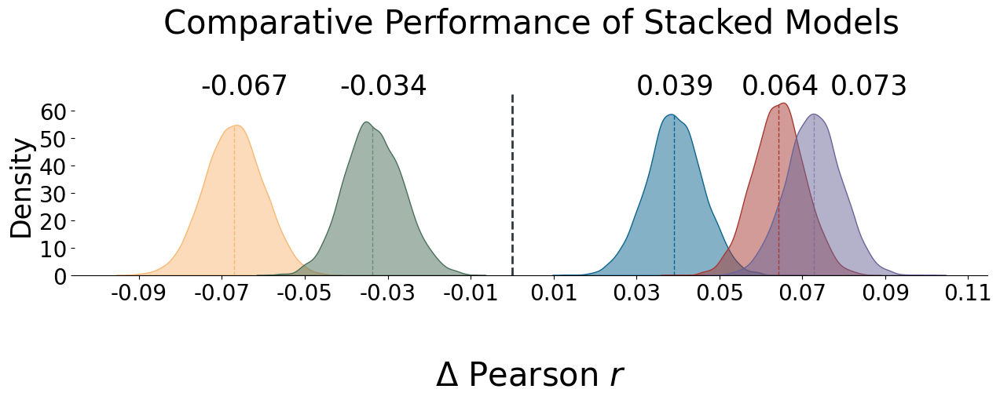

In [ ]:
# KDE plot: Composite body vs brain and whole-body markers
fig = plt.figure(figsize=(15,3))

kde = sns.kdeplot(
   data=combined_df, x="delta_r", hue="modality",
   fill=True, common_norm=False, palette=kde_palette,
   alpha=.5, linewidth=1, legend=False
)

# Add median lines and labels
modalities = combined_df['modality'].unique()
for mod in modalities:
    median_delta = combined_df[combined_df['modality'] == mod]['delta_r'].median()
    #plt.axvline(median_delta, color='grey', linestyle='--', linewidth=0.7)
    
    # Different x-offsets to prevent overlap
    if median_delta < 0.01:
        x_offset = -0.008
        ha = 'left'
    elif median_delta < 0.05:
        x_offset = -0.009
        ha = 'left'
    elif median_delta < 0.065:
        x_offset = -0.009
        ha = 'left'
    elif median_delta > 0.07:
        x_offset = 0.004
        ha = 'left'
    else:  # Larger values
        x_offset = 0.005
        ha = 'left'
    
    plt.text(median_delta + x_offset, plt.gca().get_ylim()[1] * 0.88 + 8, 
             f'{median_delta:.3f}', color='black', fontsize=25, ha=ha)

# Add zero reference line
plt.axvline(x=0, color='#32363FFF', linestyle='--', linewidth=2, alpha=1) #BE4A47FF
# Add short vertical lines at KDE peak for each modality
for mod in modalities:
    r_vals = combined_df[combined_df['modality'] == mod]['delta_r'].dropna()
    median_delta = r_vals.median()

    # Estimate KDE height at median
    kde = gaussian_kde(r_vals)
    y_peak = kde(median_delta)[0]

    # Draw vertical line from y=0 to KDE peak
    plt.plot([median_delta, median_delta], [0, y_peak], color=kde_palette.get(mod, 'grey'), linestyle='--', linewidth=1)

# ------------
sns.despine(left=True)
plt.title("Comparative Performance of Stacked Models", fontsize=30, y=1.3) #Body Stacked vs Brain Stacked
plt.xlabel("Δ Pearson $r$", fontsize=30, labelpad=50)
plt.ylabel("Density", fontsize=25)
plt.yticks(fontsize=20)
#plt.xticks(fontsize=20)

# Adjust x-ticks for delta values
x_min = combined_df['delta_r'].min()
x_max = combined_df['delta_r'].max()
x_ticks = np.arange(round(x_min, 2), round(x_max, 2) + 0.02, 0.02)
plt.xticks(ticks=x_ticks, labels=[f'{x:.2f}' for x in x_ticks], fontsize=20)

plt.savefig(os.path.join(fig_path, 'Fig4a_delta_r_brain_vs_body_stacked_scaled_KDE.svg'),
            bbox_inches="tight", 
            #pad_inches=1, 
            transparent=False, 
            facecolor="w", 
            edgecolor='w', 
            orientation='landscape',
            format='svg')

plt.show()

## Figure 4b

Combined scatterplots of predicted vs observed g

In [ ]:
# Combined scatterplots of predicted vs observed g: Config
bootstrapping_path = '/UK_BB/brainbody/bootstrap/stack'
modalities_to_plot = ['body', 'allmri', 'dwi', 'rs', 'smri', 'brain-body']

folds = range(0,5)
base_path = '/UK_BB/brainbody'

dticmap = sns.light_palette("#0d648f", as_cmap=True)
rscmap = sns.light_palette("#4B6F5A99", as_cmap=True)
t1cmap = sns.light_palette("#f8b976", as_cmap=True)
stackcmap = sns.light_palette("#A73933FF", as_cmap=True)
bodycmap = sns.light_palette("#871C0FFF", as_cmap=True)
allmricmap = sns.light_palette("#6A659999", as_cmap=True)

modality_cmaps = {
    'dwi': dticmap,
    'rs': rscmap,
    'smri': t1cmap,
    'brain-body': stackcmap,
    'body': bodycmap,
    'allmri': allmricmap
}

modality_map = {
    'body': 'Composite Body',
    'allmri': 'Composite Brain', 
    'dwi': 'dwMRI',
    'rs': 'rsMRI',
    'smri': 'sMRI',
    'brain-body': 'Body+Brain'
}


# -----------------------
# Load precomputed performance metrics AND bootstrap confidence intervals
brain_metrics = pd.read_excel(os.path.join(base_path, r'result/2level/2level_result-mean_brain_stack.xlsx'))
body_metrics = pd.read_excel(os.path.join(base_path, r'result/2level/2level_result-mean_body_stack_outer.xlsx'))
brain_body_metrics = pd.read_excel(os.path.join(base_path, r'result/2level/2level_result-mean_brain_and_body_stack_outer.xlsx'))

# Load bootstrap confidence intervals
bootstrap_ci_path = '/UK_BB/brainbody/bootstrap/stack/scaled/results/combined_bootstrap_CI_results_stacked_sorted_scaled.xlsx'
bootstrap_df = pd.read_excel(bootstrap_ci_path)

# Combine into one master dataframe
all_metrics_df = pd.concat([brain_metrics, body_metrics, brain_body_metrics], ignore_index=True)

# Create comprehensive annotation dictionary with bootstrap CIs
annotation_metrics = {}

for _, row in all_metrics_df.iterrows():
    # Standardize modality names
    modality_key = row['Modality'].lower()
    
    # Replace specific patterns
    modality_key = modality_key.replace('3 brain mri modalities', 'allmri')
    modality_key = modality_key.replace('body physiology', 'body')
    modality_key = modality_key.replace('brain mri and body physiology', 'brain-body')
    modality_key = modality_key.replace('brain mri and body', 'brain-body')
    modality_key = modality_key.replace('dwmri', 'dwi')
    modality_key = modality_key.replace('rsmri', 'rs')
    modality_key = modality_key.replace('smri', 'smri')
    modality_key = modality_key.replace(' ', '-')
    
    # Store the main metrics
    annotation_metrics[modality_key] = {
        'r_value': row['Test Pearson r'],
        'r2_value': row['Test R2'],
        'r_ci_lower': None,
        'r_ci_upper': None,
        'r2_ci_lower': None,
        'r2_ci_upper': None
    }

# Add bootstrap confidence intervals
for _, row in bootstrap_df.iterrows():
    if row['Metric'] in ['R2', 'r']:
        # Standardize modality names to match
        modality_key = row['Modality'].lower()
        modality_key = modality_key.replace('3 brain mri modalities', 'allmri')
        modality_key = modality_key.replace('body physiology', 'body')
        modality_key = modality_key.replace('brain mri and body physiology', 'brain-body')
        modality_key = modality_key.replace('brain mri and body', 'brain-body')
        modality_key = modality_key.replace('dwmri', 'dwi')
        modality_key = modality_key.replace('rsmri', 'rs')
        modality_key = modality_key.replace('smri', 'smri')
        modality_key = modality_key.replace(' ', '-')
        
        if modality_key in annotation_metrics:
            if row['Metric'] == 'R2':
                annotation_metrics[modality_key]['r2_ci_lower'] = row['CI_lower']
                annotation_metrics[modality_key]['r2_ci_upper'] = row['CI_upper']
            elif row['Metric'] == 'r':
                annotation_metrics[modality_key]['r_ci_lower'] = row['CI_lower']
                annotation_metrics[modality_key]['r_ci_upper'] = row['CI_upper']

print("Loaded annotation metrics for modalities:")
for modality, metrics in annotation_metrics.items():
    print(f"  {modality}: r={metrics['r_value']:.3f}, R²={metrics['r2_value']:.3f}")
    if metrics['r_ci_lower'] is not None:
        print(f"    r CI: [{metrics['r_ci_lower']:.3f}, {metrics['r_ci_upper']:.3f}]")
    if metrics['r2_ci_lower'] is not None:
        print(f"    R² CI: [{metrics['r2_ci_lower']:.3f}, {metrics['r2_ci_upper']:.3f}]")

Loaded annotation metrics for modalities:
  allmri: r=0.477, R²=0.227
    r CI: [0.467, 0.486]
    R² CI: [0.218, 0.236]
  dwi: r=0.443, R²=0.171
    r CI: [0.433, 0.453]
    R² CI: [0.159, 0.183]
  rs: r=0.371, R²=0.128
    r CI: [0.360, 0.381]
    R² CI: [0.118, 0.138]
  smri: r=0.337, R²=0.098
    r CI: [0.326, 0.348]
    R² CI: [0.088, 0.108]
  body: r=0.400, R²=0.163
    r CI: [0.395, 0.413]
    R² CI: [0.131, 0.146]
  brain-body: r=0.470, R²=0.218
    r CI: [0.460, 0.477]
    R² CI: [0.176, 0.191]


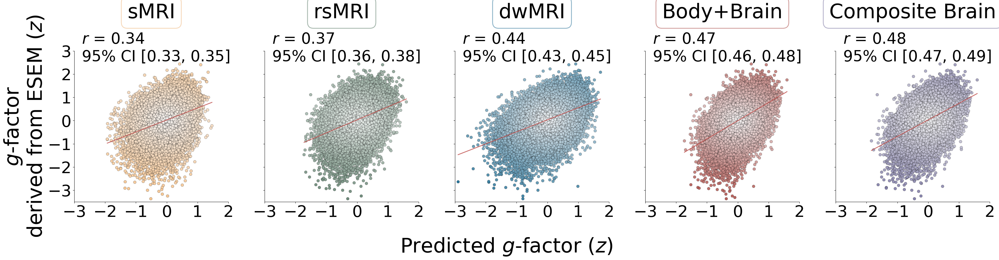

In [ ]:
# Combined scatterplots
ordered_modalities = ['smri', 'rs', 'dwi', 'brain-body', 'allmri']

# Create figure with 1 row and 5 columns
fig, axes = plt.subplots(1, 5, figsize=(35, 8))

for idx, modality in enumerate(ordered_modalities):
    if idx >= len(axes):
        break
        
    try:
        # Load data
        input_path = os.path.join(bootstrapping_path, f'{modality}_folds_combined_test.csv')
        df = pd.read_csv(input_path)
        
        # Get colormap
        cmap = modality_cmaps[modality]
        
        # Plot on subplot
        ax = axes[idx]
        x_col = 'g_pred_stack_test'
        y_col = 'g_obs_test'
        
        x = pd.to_numeric(df[x_col], errors='coerce').astype(float)
        y = pd.to_numeric(df[y_col], errors='coerce').astype(float)
        
        # Compute distance for coloring
        x_mean, y_mean = x.mean(), y.mean()
        dist_i = np.sqrt((y - y_mean)**2 + (x - x_mean)**2)
        
        # Scatter plot - updated parameters
        sc = ax.scatter(
            x, y, c=dist_i, cmap=cmap,
            s=50, alpha=0.9,
            edgecolors='black', linewidth=0.3
        )
        
        # Regression line
        mask = np.isfinite(x) & np.isfinite(y)
        if mask.sum() >= 2:
            z = np.polyfit(x[mask], y[mask], 1)
            p = np.poly1d(z)
            xs = np.linspace(x[mask].min(), x[mask].max(), 200)
            ax.plot(xs, p(xs), alpha=0.8, linewidth=2, color='#BE4A47FF', linestyle='-')

        # Set axis limits and ticks
        ax.set_xlim(-3, 2)
        ax.set_ylim(-3.5, 3)
        ax.xaxis.set_major_locator(MultipleLocator(1))
        ax.yaxis.set_major_locator(MultipleLocator(1))
        
        # Add annotation with updated format
        if modality in annotation_metrics:
            metrics = annotation_metrics[modality]
            r_value = metrics['r_value']
            r_ci_lower = metrics.get('r_ci_lower')
            r_ci_upper = metrics.get('r_ci_upper')
            
            # Updated annotation text format
            if r_ci_lower is not None:
                annotation_text = f'$r$ = {r_value:.2f}'
                annotation_text += f'\n95% CI [{r_ci_lower:.2f}, {r_ci_upper:.2f}]'
            else:
                annotation_text = rf'$r$ = {r_value:.2f}'

            ax.text(
                0.05, 0.91, annotation_text,
                transform=ax.transAxes, fontsize=38,
                va='bottom', ha='left'
            )
        
        # Set labels with updated format
        if idx == 0:  # Only for first plot
            ax.set_ylabel('$g$-factor\nderived from ESEM ($z$)', fontsize=50)
        else:
            ax.set_ylabel('')  # Empty for plots 2-5
            ax.set_yticklabels([])
        
        # Set title with bbox edge color matching modality cmap
        title_color = cmap(0.5)
        ax.set_title(modality_map.get(modality, modality), fontsize=50, y=1.2,
                    bbox=dict(facecolor='white', alpha=0.9, edgecolor=title_color, 
                             linewidth=2, boxstyle='round,pad=0.3'))
        
        # Remove frame (spines) - updated formatting
        sns.despine(top=True, right=True, ax=ax)
        
        # Set tick label sizes - updated formatting
        ax.tick_params(axis='x', labelsize=40)
        ax.tick_params(axis='y', labelsize=40)
        
    except Exception as e:
        print(f"Error in combined plot for {modality}: {str(e)}")
        axes[idx].text(0.5, 0.5, f"Error\n{modality}", ha='center', va='center', transform=axes[idx].transAxes)

# Remove empty subplots if any
for idx in range(len(ordered_modalities), len(axes)):
    fig.delaxes(axes[idx])

# Add global x-label
fig.text(0.5, -0.12, 'Predicted $g$-factor ($z$)', ha='center', fontsize=50)

plt.tight_layout()

scatter_save_dir = '/UK_BB/brainbody/figures'
plt.savefig(os.path.join(scatter_save_dir, 'Fig4b_all_modalities_combined.png'), dpi=300, bbox_inches='tight', pad_inches=0.5)
plt.show()

## Figure 4c

Feature importance: heatmaps dwMRI + rsMRI

In [ ]:
# Functions to transform 1D correlations dataframe to 2D correlation matrix
def long_to_square_matrix_dwi(correlation, coordinates):
    regions = coordinates['name'].values
    
    n = len(regions)
    corr_matrix = np.zeros((n, n))
    pval_matrix = np.ones((n, n))
    
    name_to_idx = {name: idx for idx, name in enumerate(regions)}
    
    for _, row in correlation.iterrows():
        i = name_to_idx[row['region_i']]
        j = name_to_idx[row['region_j']]
        corr_matrix[i, j] = row['Pearson r']
        corr_matrix[j, i] = row['Pearson r']
        pval_matrix[i, j] = row['p-value']
        pval_matrix[j, i] = row['p-value']
    
    return (
        pd.DataFrame(corr_matrix, index=regions, columns=regions),
        pd.DataFrame(pval_matrix, index=regions, columns=regions)
    )

def long_to_square_matrix_rs(correlation, coordinates):
    regions = coordinates['name'].values
    n = len(regions)
    
    corr_matrix = np.full((n, n), np.nan)
    pval_matrix = np.full((n, n), np.nan)
    
    np.fill_diagonal(corr_matrix, 1.0)
    np.fill_diagonal(pval_matrix, 0.0)
    
    name_to_idx = {name: idx for idx, name in enumerate(regions)}
    
    for _, row in correlation.iterrows():
        i = name_to_idx[row['region_i']]
        j = name_to_idx[row['region_j']]
        corr_matrix[i, j] = row['Pearson r']
        corr_matrix[j, i] = row['Pearson r']
        pval_matrix[i, j] = row['p-value']
        pval_matrix[j, i] = row['p-value']
    
    return (
        pd.DataFrame(corr_matrix, index=regions, columns=regions),
        pd.DataFrame(pval_matrix, index=regions, columns=regions)
    )

# Load data
base_path = '/UK_BB/brainbody'
schaefer_corr_dwi = '/UK_BB/brainbody/feature_imp/feature_imp_brain/dwmri/Schaefer7n200p_Tian_S1_Streamline_Count_i2_corr_with_g_stack_with_regions.csv'
schaefer_corr_rs = '/UK_BB/brainbody/feature_imp/feature_imp_brain/rsmri/Schaefer7n200p_Tian_S1_Full_Corr_i2_corr_with_g_stack_with_regions.csv'

corr_dwi = pd.read_csv(schaefer_corr_dwi)
corr_rs = pd.read_csv(schaefer_corr_rs)
coords = pd.read_csv('/UK_BB/brainbody/feature_imp/feature_imp_brain/mni_coords.csv')

# Read region order
with open(os.path.join(base_path, 'feature_imp/feature_imp_brain/conn_regions_reordered.txt'), 'r') as f:
    final_order = [line.strip() for line in f.readlines()]

# Assign 'Subcortical' as network for subcortical regions (FIXED: Do this FIRST)
coords['network'] = coords.apply(
    lambda row: row['network'] if row['type'] == 'cortical' else 'Subcortical',
    axis=1
)

# Assign hemisphere for subcortical regions
coords['hemi'] = coords.apply(
    lambda row: row['hemi'] if row['type'] == 'cortical' else (
        row['name'].split('-')[-1] if row['name'].endswith(('-lh', '-rh')) else 'none'
    ),
    axis=1
)

# Align coordinates to final order
coords_aligned = (
    coords.set_index('name')
          .loc[final_order]
          .reset_index()
)

# Convert to correlation matrices
corr_matrix_dwi, pval_matrix_dwi = long_to_square_matrix_dwi(corr_dwi, coords)
corr_matrix_rs, pval_matrix_rs = long_to_square_matrix_rs(corr_rs, coords)

# Reorder correlation matrices
corr_matrix_ordered_dwi = corr_matrix_dwi.loc[final_order, final_order]
corr_matrix_ordered_rs = corr_matrix_rs.loc[final_order, final_order]

# Set up network colors and names
network_colors = {
    'Vis': '#ff0000',
    'SomMot': '#00fa9a',
    'DorsAttn': '#0076BBFF',
    'SalVentAttn': '#00ced1',
    'Limbic': '#ffff00',
    'Cont': '#BBBBBB',
    'Default': '#ff69b4',
    'Subcortical': '#5AAE61FF'
}

structure_names = {
    'Vis': 'Vis',
    'SomMot': 'SomMot',
    'DorsAttn': 'DAN',
    'SalVentAttn': 'VAN',
    'Limbic': 'Limb',
    'Cont': 'Cont',
    'Default': 'DMN',
    'Subcortical': 'Subcort'
}

structure_names_full = {
    'Vis': 'Visual',
    'SomMot': 'Somatomotor',
    'DorsAttn': 'Dorsal Attention',
    'SalVentAttn': 'Salience/Ventral Attention',
    'Limbic': 'Limbic',
    'Cont': 'Control',
    'Default': 'Default Mode',
    'Subcortical': 'Subcortical'
}

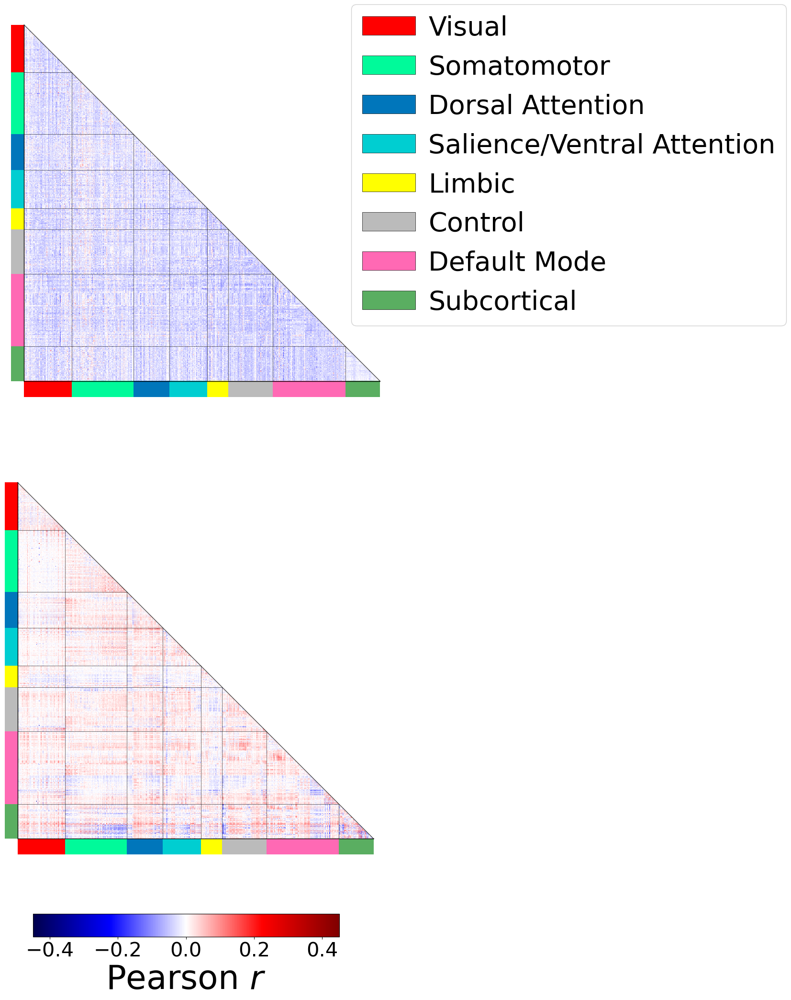

In [ ]:
# Plot heatmap: vertical
n = len(corr_matrix_ordered_dwi)

# Create figure with two subplots side by side
fig, axes = plt.subplots(2, 1, figsize=(16, 24), gridspec_kw={'height_ratios': [1, 1], 'hspace': 0.2})

cmap = sns.color_palette("seismic", as_cmap=True)
vmin, vmax = -0.45, 0.45

# Create lower triangle mask (hides lower triangle, shows upper triangle)
#upper_triangle_mask = np.tril(np.ones_like(corr_matrix_ordered_dwi, dtype=bool), k=-1)
lower_triangle_mask = np.triu(np.ones_like(corr_matrix_ordered_dwi, dtype=bool), k=1)

# Top
ax1 = axes[0]

rs_data = corr_matrix_ordered_rs.values.copy()
np.fill_diagonal(rs_data, 0)

sns.heatmap(
    rs_data,
    mask=lower_triangle_mask,
    cmap=cmap,
    center=0,
    vmin=vmin, vmax=vmax,
    square=True,
    xticklabels=False,
    yticklabels=False,
    linewidths=0,
    cbar=False,
    ax=ax1,
    rasterized=True
)

# Diagonal line for left plot (bottom-left to top-right)
ax1.plot([0, n], [0, n], color='black', linewidth=1, linestyle='-', alpha=0.7)

# Add rsMRI label
#ax1.text(-0.1, 0.5, 'rsMRI', transform=ax1.transAxes, fontsize=30, va='center', ha='right', rotation=90)

# Bottom
ax2 = axes[1]

dwi_data = corr_matrix_ordered_dwi.values.copy()
np.fill_diagonal(dwi_data, 0)

sns.heatmap(
    dwi_data,
    mask=lower_triangle_mask,  # mask shows upper triangle
    cmap=cmap,
    center=0,
    vmin=vmin, vmax=vmax,
    square=True,
    xticklabels=False,
    yticklabels=False,
    linewidths=0,
    cbar=False,
    ax=ax2,
    rasterized=True
)

# Diagonal line for bottom plot
ax2.plot([0, n], [0, n], color='black', linewidth=1, linestyle='-', alpha=0.7)

# Add dwMRI label
#ax2.text(1.1, 0.5, 'dwMRI', transform=ax2.transAxes, fontsize=30, va='center', ha='left', rotation=270)

# Add shared colorbar
from matplotlib.cm import ScalarMappable
from matplotlib.colors import Normalize

sm = ScalarMappable(cmap=cmap, norm=Normalize(vmin=vmin, vmax=vmax))
sm.set_array([])

cbar_ax = fig.add_axes([0.3, 0.08, 0.4, 0.02])
cbar = fig.colorbar(sm, cax=cbar_ax, orientation='horizontal')
cbar.set_label('Pearson $r$', fontsize=50)
cbar.ax.tick_params(labelsize=30)

# Annotations
bottom_y = n + 1.5
left_x = -8
left_x -= 12
bar_height = 25
bar_width = 20

# Get network boundaries
network_boundaries = []
current_network = None
for i, region in enumerate(corr_matrix_ordered_dwi.index):
    network = coords_aligned.loc[coords_aligned['name'] == region, 'network'].values[0]
    if network != current_network:
        if current_network is not None:
            network_boundaries.append((start_idx, i, current_network))
        start_idx = i
        current_network = network
network_boundaries.append((start_idx, n, current_network))

# Apply to bottom plot
for start, end, network in network_boundaries:
    color = network_colors[network]
    
    # Bottom color bar
    ax1.add_patch(plt.Rectangle(
        (start, bottom_y - 2),
        end - start, 
        bar_height,
        facecolor=color,
        clip_on=False
    ))
    
    # Left color bar
    ax1.add_patch(plt.Rectangle(
        (left_x, start),
        bar_width, 
        end - start,
        facecolor=color,
        clip_on=False
    ))
    
    # Structure labels
    mid_point = (start + end) / 2
    # Left
    #ax1.text(left_x + 17, mid_point - 2.1, structure_names.get(network, network), ha='right', va='center', fontsize=15, rotation=90)
    # Bottom
    #ax1.text(mid_point, bottom_y + bar_height/1.5 + 2, structure_names.get(network, network), ha='center', va='bottom', fontsize=15)

# Apply to dwMRI
for start, end, network in network_boundaries:
    color = network_colors[network]
    
    # Bottom color bar
    ax2.add_patch(plt.Rectangle(
        (start, bottom_y - 2),
        end - start, 
        bar_height,
        facecolor=color,
        clip_on=False
    ))
    # Left color bar
    ax2.add_patch(plt.Rectangle(
        (left_x, start),
        bar_width, 
        end - start,
        facecolor=color,
        clip_on=False
    ))
    
    # Structure labels for bottom
    mid_point = (start + end) / 2
    # Left
    #ax2.text(left_x + 17, mid_point - 2.1, structure_names.get(network, network), ha='right', va='center', fontsize=15, rotation=90)
    # Bottom
    #ax2.text(mid_point, bottom_y + bar_height/1.5 + 2, structure_names.get(network, network), ha='center', va='bottom', fontsize=15)

# Grid lines and limits for LEFT plot
top_y = -10
for boundary in [b[0] for b in network_boundaries[1:]]:
    # For upper triangle orientation
    ax1.plot([boundary, boundary], [boundary, n], color='black', linewidth=0.4, alpha=1)  # Vertical
    ax1.plot([0, boundary], [boundary, boundary], color='black', linewidth=0.4, alpha=1)  # Horizontal

ax1.set_xlim(left_x - 1, n + 0.8)
ax1.set_ylim(n + bar_height + 2, top_y - 2)

# Only draw left and bottom borders
ax1.plot([0, 0], [0, n], color='black', linewidth=1)  # Left border
ax1.plot([0, n], [n, n], color='black', linewidth=1)  # Bottom border

# Grid lines and limits for Rbottomplot
for boundary in [b[0] for b in network_boundaries[1:]]:
    ax2.plot([boundary, boundary], [boundary, n], color='black', linewidth=0.4, alpha=1)  # Vertical
    ax2.plot([0, boundary], [boundary, boundary], color='black', linewidth=0.4, alpha=1)  # Horizontal

ax2.set_xlim(-1, n + 0.8)
ax2.set_ylim(n + bar_height + 2, top_y - 2)

# Only draw left and bottom borders
ax2.plot([0, 0], [0, n], color='black', linewidth=1)  # Left border  
ax2.plot([0, n], [n, n], color='black', linewidth=1)  # Bottom border

# Individual titles for each subplot
#ax1.set_title("rsMRI Feature Importance:\nSchaefer7n500p-IV Full Correlation", fontsize=36, pad=20)
#ax2.set_title("dwMRI Feature Importance:\nSchaefer7n500p-IV Streamline Count", fontsize=36, pad=20)

# Clean up all spines
for ax in [ax1, ax2]:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)

# Extract unique networks
unique_networks = sorted(set(
    coords_aligned.loc[coords_aligned['name'].isin(corr_matrix_ordered_dwi.index), 'network']
))

# Create legend elements
legend_elements = []
# Set up network order matching patches
unique_networks = [network for _, _, network in network_boundaries] 
for network in unique_networks:
    color = network_colors.get(network, 'gray')
    label = structure_names_full.get(network, network)
    legend_elements.append(
        plt.Rectangle((0, 0), 1, 1, facecolor=color, edgecolor='black', 
                      linewidth=0.5, label=label)
    )

# Add legend to figure
legend = fig.legend(
    handles=legend_elements,
    loc='lower center',
    ncol= 1, #min(len(unique_networks), 9),  # Adjust columns
    fontsize=40,
    frameon=True,
    fancybox=True,
    framealpha=0.9,
    bbox_to_anchor=(1.0, 0.6), #vertical, on the right side
    #bbox_to_anchor=(0.5, -0.01), horizontal, one row
    handletextpad=0.5,
    columnspacing=1.0,
    #title='Brain Networks',
    title_fontsize=45
)

# Make room for the legend
plt.subplots_adjust(bottom=0.15)

# Save
save_fig(['png'], os.path.join(fig_path, 'Fig4c_connectomes_heatmaps_separate'))
plt.show()

In [ ]:
'''
(x=0,y=0) -----------------(x=n,y=0)
   |                          |
   |                          |
   |                          |
   |                          |
(x=0,y=n) -----------------(x=n,y=n)
'''
'''
(0,0) → x=0, y=0 → the top-left corner of the matrix.
(n,0) → x=n, y=0 → the top-right corner of the matrix.
(0,n) → x=0, y=n → the bottom-left corner.
(n,n) → x=n, y=n → the bottom-right corner.
'''

# Figure 4d

sMRI barplots

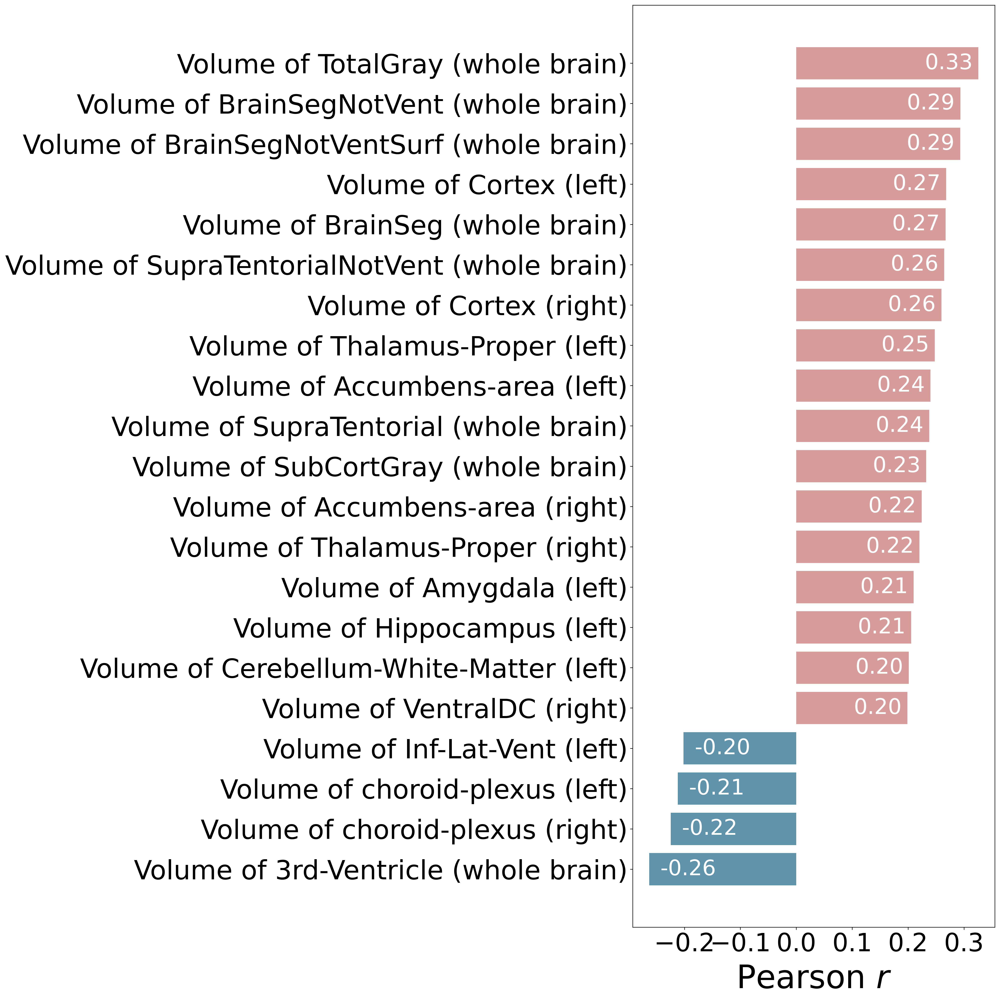

In [ ]:
# Filter to only show correlations > 0.2 in absolute value and p-value < 0.05
corr_smri = pd.read_csv(os.path.join(base_path, 'feature_imp/feature_imp_brain/struct_fs_aseg_volume_corr_with_g_stack.csv'))
plot_df_filtered = corr_smri[(corr_smri['Pearson r'].abs() > 0.195) & (corr_smri['p-value'] < 0.05)]

# Sort the filtered data
ordered = (plot_df_filtered
         .assign(abs_corr = plot_df_filtered['Pearson r'].abs())
         .sort_values('abs_corr', ascending=False)
         ).sort_values('Pearson r', ascending=False)

# Create the figure with larger dimensions
n_bars = len(ordered)
plt.figure(figsize=(20, max(20, n_bars * 0.4)), dpi=300)

# Create color list - simple positive\negative coloring
colors = ['#D79C9CFF' if x > 0 else '#5F93ACFF' for x in ordered['Pearson r']]

# Create bars with slightly thicker bars
bars = plt.barh(ordered['Feature'].str.replace(' hemisphere', ''), 
                ordered['Pearson r'], 
                color=colors,
                height=0.8)

# Add correlation values with larger font
for bar, corr in zip(bars, ordered['Pearson r']):
    width = bar.get_width()
    label_x = width - 0.01 if width > 0 else width + 0.02
    plt.text(label_x, bar.get_y() + bar.get_height()/2,
             f'{width:.2f}',
             va='center', ha='right' if width > 0 else 'left',
             color='white', fontsize=30)

# Increase all font sizes
#plt.title(f'sMRI Feature Importance:\nASEG Subcortical Volumetric Segmentation',  pad=18, fontsize=45, x=-0.5)
plt.xlabel('Pearson $r$', labelpad=10, fontsize=45)
plt.xticks(fontsize=35)
plt.ylabel('')
plt.yticks(fontsize=37)
plt.gca().invert_yaxis()

# Adjust layout with more padding
plt.tight_layout(pad=3.0)

# Save with higher quality
plt.savefig(os.path.join(fig_path, 'Fig4d_fi-smri-BARS.svg'), dpi=350,bbox_inches='tight')
plt.show()

# Figure 5

g-body commonality analysis

In [ ]:
# Prepare data for plotting
commonality_path = '/UK_BB/brainbody/commonality'
df = pd.read_csv(os.path.join(commonality_path, 'commonality_results_decompos_brain_vs_individual_body.csv'))
print(df.columns.to_list(), df['Brain MRI modality'].unique(), df['Body modality'].unique())

# Dataset 1: For Venn diagrams (stacked body modalities)
df_venn = pd.read_excel(os.path.join(commonality_path, 'commonality_results_decompos_brain_vs_body_stacked.xlsx'))

# Dataset 2: For stacked bar plots (individual body modalities)
df_bars = pd.read_csv(os.path.join(commonality_path, 'commonality_results_decompos_brain_vs_individual_body.csv'))

# Check brain modality names in both DataFrames
print("Brain modalities in df_venn (Venn diagram data):")
print(df_venn['Brain MRI modality'].unique())
print("\nBrain modalities in df_bars (bar plot data):")
print(df_bars['Brain MRI modality'].unique())

# Filter for Body physiology and composition stacked
body_modality = 'Body physiology and composition stacked'
body_df = df_venn[df_venn['Body modality'] == body_modality]

# Get all brain modalities
brain_modalities_venn = body_df['Brain MRI modality'].unique()
n_modalities = len(brain_modalities_venn)

# Prepare venn2 data
data_venn2 = []
color_palette = {
    'brain': '#4A7169FF',#'#4A7169FF'
    'body': '#A8554EFF' #'#A8554EFF'
}
for brain_mod in brain_modalities_venn:
    row = body_df[body_df['Brain MRI modality'] == brain_mod].iloc[0]
    prop_body_exp_by_brain = round((row['Common variance'] / (row['Unique variance: body'] + row['Common variance'])) * 100, 2)
    data_venn2.append((
        #row['Perc unique brain'],
        #row['Perc unique body'], 
        #row['Perc common'],
        row['Unique variance: brain'],
        row['Unique variance: body'],
        row['Common variance'],
        color_palette['brain'],
        color_palette['body'],
        brain_mod.replace('Brain ', '').replace('3 brain', '3'),
        prop_body_exp_by_brain
    ))

# Create a mapping from Venn names to bar plot names
brain_mod_mapping = {
    '3 brain MRI modalities stacked': '3 Brain MRI Modalities Stacked',
    'Brain dwMRI stacked': 'Brain dwMRI Stacked', 
    'Brain rsMRI stacked': 'Brain rsMRI Stacked',
    'Brain sMRI stacked': 'Brain sMRI Stacked'
}

# Get the brain modality names for bar plots
brain_modalities_bars = [brain_mod_mapping.get(mod, mod) for mod in brain_modalities_venn]

print(f"\nVenn brain modalities: {brain_modalities_venn}")
print(f"Bar plot brain modalities: {brain_modalities_bars}")

# Get the sorted order from the first brain modality
first_brain_mod_bars = brain_modalities_bars[0]
df_first = df_bars[df_bars['Brain MRI modality'] == first_brain_mod_bars].copy()
print(f"\nFirst brain modality for sorting: '{first_brain_mod_bars}'")
print(f"Number of rows found: {len(df_first)}")

df_first.sort_values(by='Unique variance: brain', ascending=False, inplace=True)
sorted_body_order = df_first['Body modality'].tolist()
print(f"Sorted body order length: {len(sorted_body_order)}")

# Create a dictionary to store data for each subplot
plot_data = {}
for venn_mod, bars_mod in zip(brain_modalities_venn, brain_modalities_bars):
    print(f"Processing: Venn='{venn_mod}' -> Bars='{bars_mod}'")
    
    # Filter dataframe for the current brain modality
    df_mod = df_bars[df_bars['Brain MRI modality'] == bars_mod].copy()
    print(f"  Rows found: {len(df_mod)}")
    
    # Create a categorical type with the desired order
    df_mod['Body modality'] = pd.Categorical(df_mod['Body modality'], 
                                           categories=sorted_body_order, 
                                           ordered=True)
    # Sort by the predefined order
    df_mod.sort_values('Body modality', inplace=True)
    
    # Store the data for this subplot
    plot_data[venn_mod] = {
        'body_names': df_mod['Body modality'].tolist(),
        'y1_unique_brain': df_mod['Unique variance: brain'].values,
        'y2_common': df_mod['Common variance'].values,
        'y3_unique_body': df_mod['Unique variance: body'].values,
        # Store percentages for annotations
        'perc_u_brain': df_mod['Perc unique brain'].values,
        'perc_common': df_mod['Perc common'].values,
        'perc_u_body': df_mod['Perc unique body'].values,
        'prop_body_exp_by_brain': df_mod['g-body explained by brain'].values,
        'prop_body_exp_by_brain': df_mod['g-body explained by brain'].values
    }

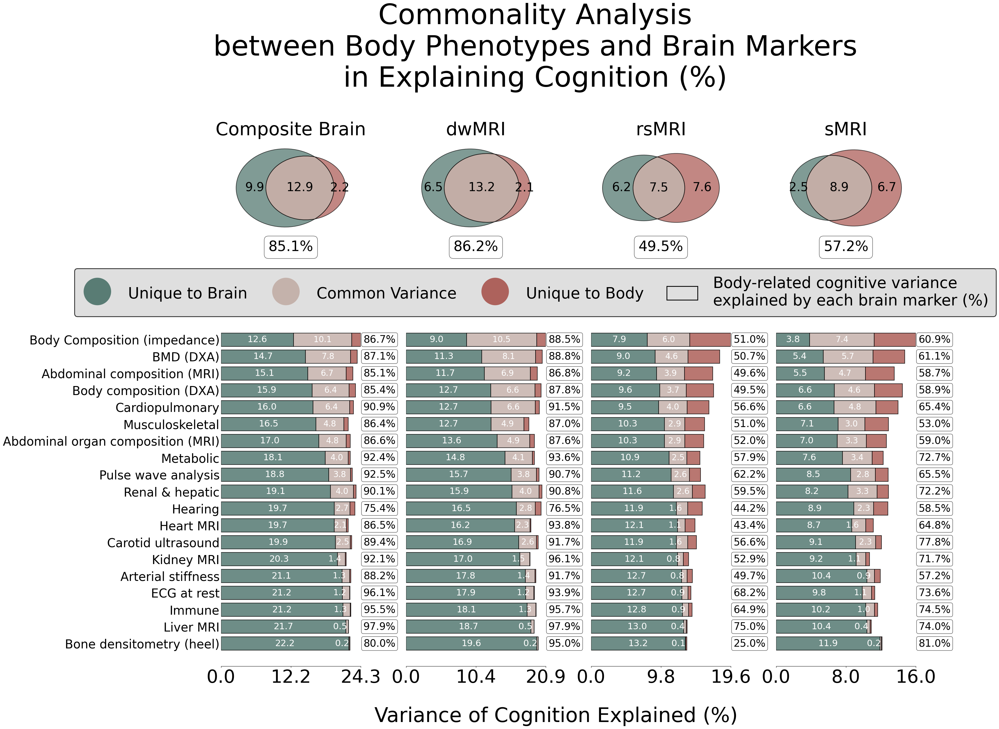

In [ ]:
# Plot
fig = plt.figure(figsize=(6*n_modalities, 24))

# Define manual positions
positions = []
# Top row - Venn diagrams
for i in range(n_modalities):
    left = 0.05 + i * (0.9/n_modalities) + i*0.04
    positions.append([left, 0.61, 0.8/n_modalities, 0.25])  # [left, bottom, width, height]

# Bottom row - Bar plots
for i in range(n_modalities):
    left = 0.05 + i * (0.9/n_modalities) + i*0.04
    positions.append([left, 0.05, 0.8/n_modalities, 0.5])

# Create axes
axes = []
for pos in positions:
    axes.append(fig.add_axes(pos))

# Define colors for stacked bars
color_unique_brain = '#4A7169FF'
color_common = '#c2ada6'
color_unique_body = '#A8554EFF'

# Plot Venn diagrams (top row - axes[0] to axes[n_modalities-1])
for i, (u_brain, u_body, c_common, color_brain, color_body, label, prop_body_exp) in enumerate(data_venn2):
    ax = axes[i]  # Use first n_modalities axes for Venn diagrams
    
    # Create venn2 diagram
    subset_sizes = (u_brain, u_body, c_common)
    #subset_sizes = ( row['Unique variance: brain'], row['Unique variance: body'], row['Common variance'])
    venn = venn2(subsets=subset_sizes, set_labels=('', ''), 
                set_colors=(color_brain, color_body), ax=ax)
    
    ax.set_ylim(-1.2, 1.2)
    ax.set_aspect(0.8) #'equal'
    ax.axis('off')

    # Apply styling
    for patch in venn.patches:
        if patch:
            patch.set_alpha(0.7)
            patch.set_linewidth(1.5)
            patch.set_edgecolor("black")
    
    # Format labels
    #for text in venn.subset_labels:
    for j, text in enumerate(venn.subset_labels):
        if text:
            val = float(text.get_text())
            text.set_text(f'{val*100:.1f}')
            text.set_fontsize(30)

            # Adjust the leftmost label (index 0 corresponds to "10" region, i.e. left circle only)
            if j == 0: # left-only subset
                x, y = text.get_position()
                text.set_position((x + 0.04, y)) # shift right by 0.05 units

            # Adjust Venn diagram annotations
            if i == 1:
                if j == 0:
                    x, y = text.get_position()
                    text.set_position((x - 0.035, y))

            if i == 3:
                if j == 0:
                    x, y = text.get_position()
                    text.set_position((x - 0.035, y))

    # Add title and annotation using figure coordinates
    titles = [ "Composite Brain",
                "dwMRI",
                "rsMRI",
                "sMRI" ]
    
    # Title
    title_x = positions[i][0] + positions[i][2]/2  # Center of the Venn axes
    fig.text(title_x, 0.83, titles[i], fontsize=45, ha='center', va='top')
    
    # Annotation
    annotation_text = f"{prop_body_exp:.1f}%"
    fig.text(title_x, 0.65, annotation_text, ha='center', va='center',
             fontsize=35, 
             bbox=dict(boxstyle="round,pad=0.3", facecolor='white', alpha=0.7))


for idx, brain_mod in enumerate(brain_modalities_venn):
    ax = axes[n_modalities + idx]
    data = plot_data[brain_mod]
    y_labels = data['body_names']
    # Stacked barplots (bottom row - axes[n_modalities] to axes[2*n_modalities-1])
    y_labels = [' '.join(word.upper() if word.upper() in ['MRI', 'DXA', 'ECG'] else word.lower() if i > 0 else word.capitalize() for i, word in enumerate(label.split())) 
                for label in y_labels]
    rename_dict = {
        'Bone densitometry (of heel)': 'Bone densitometry (heel)',
        'Abdominal organ composition by MRI': 'Abdominal organ composition (MRI)',
        'Body composition by DXA': 'Body composition (DXA)',
        'Abdominal composition by MRI': 'Abdominal composition (MRI)',
        'Bone size, mineral and density by DXA': 'BMD (DXA)',
        'Body composition by impedance': 'Body Composition (impedance)'
        }
    
    y_labels = [rename_dict.get(lbl, lbl) for lbl in y_labels]

    y1 = data['y1_unique_brain']*100
    y2 = data['y2_common']*100  
    y3 = data['y3_unique_body']*100
    prop_body_exp_by_brain = data['prop_body_exp_by_brain']
    bar_height = 0.8
    
    # Create stacked horizontal bars
    ax.barh(y_labels, y1, height=bar_height, color=color_unique_brain, alpha=0.8, edgecolor='black', linewidth=1.5)
    ax.barh(y_labels, y2, height=bar_height, left=y1, color=color_common, alpha=0.8, edgecolor='black', linewidth=1.5)
    ax.barh(y_labels, y3, height=bar_height, left=y1+y2, color=color_unique_body, alpha=0.8, edgecolor='black', linewidth=1.5)

    # Add percentage annotations on each segment
    for i, (u_brain, common, u_body) in enumerate(zip(y1, y2, y3)):
        if u_brain > 0.001:
            ax.text(u_brain / 2, i, f'{u_brain:.1f}', ha='center', va='center',
                color='white', fontsize=22)
        if common > 0.001:
            if common < 0.9:  # Small common variance - to the left
            # Position at the start of the common segment, shifted slightly right
                ax.text(u_brain + common / 2, i, f'{common:.1f}', ha='right', va='center',
                        color='white', fontsize=22)
            elif common < 2 and common > 1:
                ax.text(u_brain + common / 2, i, f'{common:.1f}', ha='right', va='center', color='white', fontsize=20)
            else:  # Normal/large common variance - center
                ax.text(u_brain + common / 2, i, f'{common:.1f}', ha='center', va='center', color='white', fontsize=20)
        if u_body: # > 0.001:
            #ax.text(u_brain + common + u_body / 2, i, f'{m_u_body:.2f}', ha='center', va='center', color='white', fontsize=20)
            pass
        prop_text = f'{prop_body_exp_by_brain[i]:.1f}%'
        ax.text(1.25, i, prop_text, ha='right', va='center',  
                fontsize=25, transform=ax.get_yaxis_transform(), color='black', bbox=dict(boxstyle="round,pad=0.2", facecolor='white', alpha=0.7))
    
    # Format the subplot
    ax.tick_params(axis='y', labelsize=30, length=0)
    ax.tick_params(axis='x', labelsize=45)
    ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    max_total = max(y1 + y2 + y3)
    ax.set_xlim(0, max_total)
    ax.set_xticks([0, max_total])

    # Put ticks at 0, half, and max
    import matplotlib.ticker as mticker
    half_point = max_total / 2
    ax.xaxis.set_major_locator(mticker.FixedLocator([0, half_point, max_total]))

    if idx > 0:
        ax.set_yticklabels([])
    
    for spine in ['top', 'right', 'left']:
        ax.spines[spine].set_visible(False)

# Add common x-axis label for bar plots
fig.text(0.53, -0.03, 'Variance of Cognition Explained (%)', ha='center', fontsize=50)
fig.suptitle('Commonality Analysis\nbetween Body Phenotypes and Brain Markers\nin Explaining Cognition (%)', fontsize=70, y=1)


def make_circle_legend(legend, orig_handle, xdescent, ydescent, width, height, fontsize):
    return plt.Circle((width/2, height/2), min(width, height))

legend_elements = [
    plt.Circle((0,0), 0.5, facecolor=color_unique_brain, alpha=0.9, label='Unique to Brain'),
    plt.Circle((0,0), 0.5, facecolor=color_common, alpha=0.9, label='Common Variance'),
    plt.Circle((0,0), 0.5, facecolor=color_unique_body, alpha=0.9, label='Unique to Body'),
    plt.Rectangle((0,0), 1, 1, facecolor='none', edgecolor='black', lw=2,
                       label='Body-related cognitive variance\nexplained by each brain marker (%)')]

leg = fig.legend(handles=legend_elements, loc='lower center', ncol=4,
           fontsize=38, frameon=True, #bbox_to_anchor=(0.5, -0.005),
           fancybox=True,
           bbox_to_anchor=(0.5, 0.54),
           handler_map={plt.Circle: HandlerPatch(patch_func=make_circle_legend)},
           handletextpad=1.0, handleheight=1.0,
           columnspacing=1.5, labelspacing=1.5,
           borderpad=0.5
)

# Control the legend frame linewidth and color
frame = leg.get_frame()
frame.set_linewidth(2)
frame.set_edgecolor("black"),
frame.set_facecolor(((216/255, 216/255, 216/255, 1)))

# Save
save_paths = [
    os.path.join(fig_path, 'final/Fig5'),
    os.path.join(fig_path, 'Fig5_ca_g_body_exp_by_brain_stacked_bars_plus_venn_marginalR2'),]
for path in save_paths:
    save_fig(['png', 'svg'], path)
plt.show()

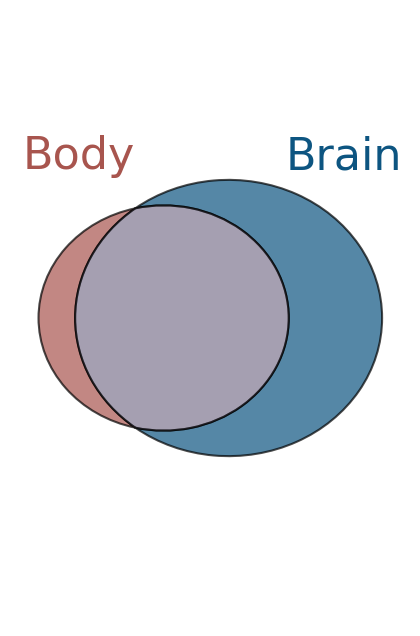

In [ ]:
# Venn 2 for Fig1
fig, ax = plt.subplots(figsize=(8, 8))

u_brain, u_body, c_common, color_brain, color_body, label, prop_body_exp = data_venn2[0]

subset_sizes = (u_body, u_brain, c_common)
venn = venn2(subsets=subset_sizes, set_labels=('Body','Brain'),  # add labels
            set_colors=(color_body, '#0D5581FF'), ax=ax)

ax.set_ylim(-1.2, 1.2)
ax.set_aspect(0.9)
ax.axis('off')

# Apply styling
for patch in venn.patches:
    if patch:
        patch.set_alpha(0.7)
        patch.set_linewidth(1.5)
        patch.set_edgecolor("black")

# Remove text inside circles
for text in venn.subset_labels:
    if text:
        text.set_text('')

# Labels
for i, text in enumerate(venn.set_labels):
    if text:
        text.set_fontsize(32)
        label_colors = [color_body, '#0D5581FF']
        text.set_color(label_colors[i])
        
        # Position adjustments
        if i == 0:  # "Brain" label - move left
            x, y = text.get_position()
            text.set_position((x - 0.1, y + 1.2))
        elif i == 1:  # "Body" label - move right
            x, y = text.get_position()
            text.set_position((x + 0.2, y + 1.3))
# Save
save_fig(['svg'], os.path.join(fig_path, 'Fig1d_venn2'))
plt.show()

# Figure 6

## Figure 6a

g-age commonality analysis: venn3 diagrams

In [ ]:
# Set the path
commonality_path = '/UK_BB/brainbody/commonality'

In [ ]:
# Prepare data for plotting
commonality_path = 'Volumes/sci-psy-narun/IBu/UK_BB/brainbody/commonality'

df = pd.read_csv(
    os.path.join(commonality_path, 'commonality_results_body_plus_brain_age_3v.csv')
)

# Extract raw variance components
u_body  = df['Unique: Body'].iloc[0]
u_brain = df['Unique: Brain'].iloc[0]
u_age   = df['Unique: Age'].iloc[0]

c_body_brain = df['Common: Body & Brain'].iloc[0]
c_body_age   = df['Common: Body & Age'].iloc[0]
c_brain_age  = df['Common: Brain & Age'].iloc[0]

c_all_three  = df['Common: All Three'].iloc[0]

# Pack into Venn3 order
subset_values = (
    u_body,          # 100
    u_brain,         # 010
    c_body_brain,    # 110
    u_age,           # 001
    c_body_age,      # 101
    c_brain_age,     # 011
    c_all_three      # 111
)

# Total R2
total_r2 = sum(subset_values)
print("Total R2:", round(total_r2, 4))

# Convert to percentages for plotting (Venn3 geometry)
subset_percent = tuple(v / total_r2 * 100 for v in subset_values)
print("%:", subset_percent)

100 (np.float64(-0.47124994307104684), np.float64(0.17389051893270832))
010 (np.float64(0.44718632641020317), np.float64(0.12500717951738033))
001 (np.float64(-0.25984735697458555), np.float64(-0.42522014971909733))
110 (np.float64(-0.019783505584820525), np.float64(0.3722118636572342))
101 (np.float64(-0.4165556150080759), np.float64(-0.13005105870653544))
011 (np.float64(0.22744028482618908), np.float64(-0.2771543941365472))
111 (np.float64(-0.023608633335756454), np.float64(-0.009602003687593539))


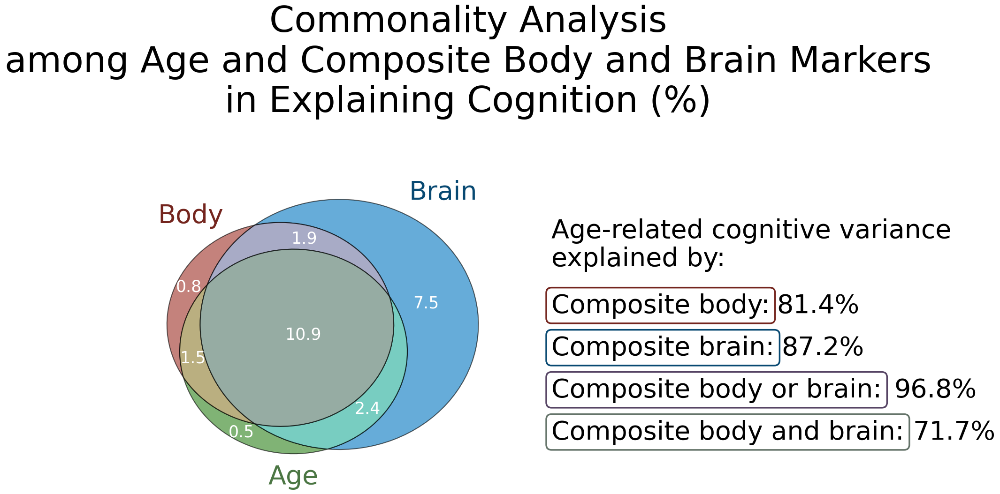

In [ ]:
# Venn 3
fig, ax = plt.subplots(figsize=(10, 10))

body = "#9E2F2584" #A8554E
brain = "#0076C0FF" #4A7169
age = "#2B811AC0" #C2ADA6

body_label = "#74251EFF" #A8554E
brain_label = "#084972FF" #4A7169
age_label = "#104905C0" #C2ADA6

# Plot using percentages
venn = venn3(
    subsets=subset_percent,
    set_labels=('Body', 'Brain', 'Age'),
    set_colors=(body, brain, age),
    ax=ax
)

ax.set_aspect(0.9)

for patch in venn.patches:
    if patch:
        patch.set_alpha(0.6)
        patch.set_edgecolor('black')
        patch.set_linewidth(1.5)

# Replace percentage labels with raw variance values
for text, real_value in zip(venn.subset_labels, subset_values):
    if text:
        text.set_text(f"{real_value*100:.1f}")
        text.set_fontsize(25)
        text.set_color('white')
    
# Set labels ("Body", "Brain", "Age")
for i, text in enumerate(venn.set_labels):
    if text:
        text.set_fontsize(40)
        #text.set_fontweight('bold')
        label_colors = [body_label, brain_label, age_label]
        text.set_color(label_colors[i]) # 'black'

# Get label positions
for region in ['100','010','001','110','101','011','111']:
    lab = venn.get_label_by_id(region)
    if lab:
        print(region, lab.get_position())

# Move Body-only label
lab = venn.get_label_by_id('100')
if lab:
    x, y = lab.get_position()
    lab.set_position((x + 0.01, y + 0.02))

# Move Brain-only label
#lab = venn.get_label_by_id('010')
#if lab:
    #x, y = lab.get_position()
    #lab.set_position((x + 0.04, y))

# Move Age-only label
#lab = venn.get_label_by_id('001')
#if lab:
   # x, y = lab.get_position()
    #lab.set_position((x, y + 0.03))

# Move Body ∩ Brain
lab = venn.get_label_by_id('110')
if lab:
    lab.set_position((-0.0197, 0.4))

# Move Body ∩ Age
lab = venn.get_label_by_id('101')
if lab:
    x, y = lab.get_position()
    lab.set_position((x - 0.03, y + 0.02))

# Move Brain ∩ Age
lab = venn.get_label_by_id('011')
if lab:
    x, y = lab.get_position()
    lab.set_position((x - 0.005, y - 0.05))

# Move triple overlap
#lab = venn.get_label_by_id('111')
#if lab:
    #x, y = lab.get_position()
    #lab.set_position((x - 0.03, y + 0.02))

# Add text on the right side of Venn diagrams
text_x_position = 1.0
text_y_start = 0.7

# Define items as (label, color, value)
# value=None means no percentage on that line
text_items = [
    ('Age-related cognitive variance', None, None, None),
    ('explained by:', None, None, None),

    # Add a blank line marker to create extra spacing
    ('', None, None, None),

    ('Composite body:', '#74251EFF', '81.4%', 0.48),
    ('Composite brain:', '#084972FF', '87.2%', 0.49),
    ('Composite body or brain:', "#564464", '96.8%', 0.73),
    ('Composite body and brain:', "#65746a", '71.7%', 0.77),
]
# Vertical spacing
header_spacing = 0.06
line_spacing   = 0.09 
extra_gap_after_header = -0.05

y_pos = text_y_start

for i, (label, color, value, x_offset) in enumerate(text_items):

    # Insert extra gap after the header block
    if i == 3:   # after the blank line
        y_pos -= extra_gap_after_header

    # Skip drawing empty lines
    if label == '' and value is None:
        y_pos -= line_spacing
        continue

    # Draw the label
    if color:
        fig.text(text_x_position, y_pos, label,
                 ha='left', va='center', fontsize=40,
                 bbox=dict(boxstyle="round,pad=0.2",
                           facecolor='white',
                           edgecolor=color,
                           linewidth=2.5),
                 transform=fig.transFigure)
    else:
        fig.text(text_x_position, y_pos, label,
                 ha='left', va='center', fontsize=40,
                 transform=fig.transFigure)

    # Draw the percentage immediately after the label
    if value and x_offset:
        fig.text(text_x_position + x_offset, y_pos,  # adjust horizontal offset
                 value,
                 ha='left', va='center', fontsize=40,
                 transform=fig.transFigure)

    y_pos -= (header_spacing if i < 3 else line_spacing)


plt.title('Commonality Analysis\namong Age and Composite Body and Brain Markers\nin Explaining Cognition (%)', fontsize=55, y=1.2, x=0.9)
save_fig(['png', 'svg'], os.path.join(fig_path, 'Fig6b_3v_commonality_body_plus_brain_plus_age'))
plt.show()

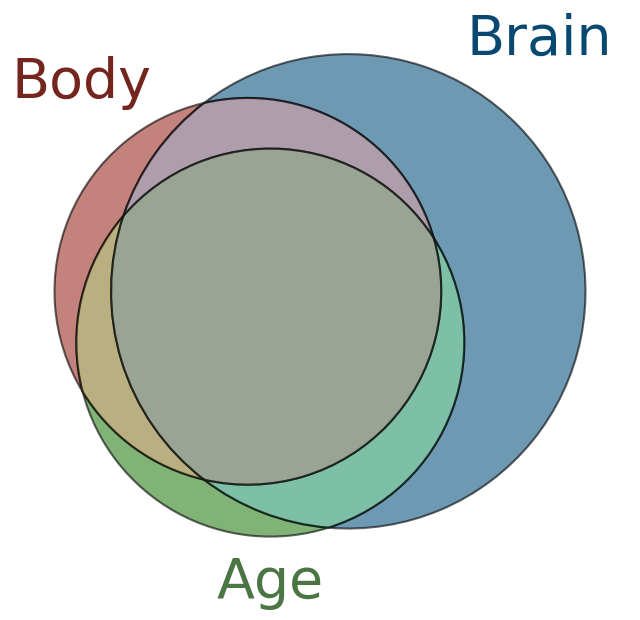

In [ ]:
# Venn 3
fig, ax = plt.subplots(figsize=(8, 8))

body = "#9E2F2584"
brain = "#0D5581FF"
age = "#2B811AC0"

body_label = "#74251EFF"
brain_label = "#084972FF"
age_label = "#104905C0"

# Plot Venn diagram
venn = venn3(
    subsets=subset_percent,
    set_labels=('Body', 'Brain', 'Age'),
    set_colors=(body, brain, age),
    ax=ax
)

# Remove axes completely
ax.axis('off')

# Remove all text labels (percentages inside circles)
for text in venn.subset_labels:
    if text:
        text.set_text('')

# Keep only the circle labels but make them smaller
for i, text in enumerate(venn.set_labels):
    if text:
        text.set_fontsize(40)
        label_colors = [body_label, brain_label, age_label]
        text.set_color(label_colors[i])

# Adjust circle transparency and edges
for patch in venn.patches:
    if patch:
        patch.set_alpha(0.6)
        patch.set_edgecolor('black')
        patch.set_linewidth(1.5)

# Save minimal figure
plt.savefig(os.path.join(fig_path, 'fig1-prep/Fig1d_venn3.svg'),
        bbox_inches="tight", 
        pad_inches=0.5, 
        transparent=False, 
        facecolor="w", 
        edgecolor='w')

plt.show()

## Figure 6b

g-age scatterplots

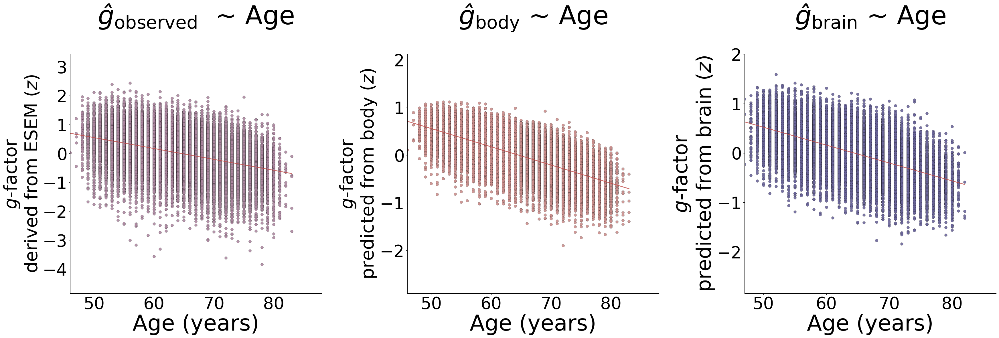

In [ ]:
# Plot scatterplots for age ~ g
body_age = pd.read_csv(os.path.join(commonality_path, 'g_obs_pred_body_with_age.csv'))
brain_age = pd.read_csv(os.path.join(commonality_path, 'g_obs_pred_allmri_with_age.csv'))
scatter_kwargs = dict(
    s=50,
    alpha=0.9,
    edgecolors='black',
    linewidth=0.2
)

fig, axs = plt.subplots(1, 3, figsize=(35, 12))

# ---------------------------------------------------------------------
# Age vs observed g
x = pd.to_numeric(body_age['Age'], errors='coerce').astype(float)
y = pd.to_numeric(body_age['g_obs_test'], errors='coerce').astype(float)
axs[0].scatter(x, y, color="#ac87a0", **scatter_kwargs)

mask = np.isfinite(x) & np.isfinite(y)
if mask.sum() >= 2:
    z = np.polyfit(x[mask], y[mask], 1)
    p = np.poly1d(z)
    xs = np.linspace(x[mask].min(), x[mask].max(), 200)
    axs[0].plot(xs, p(xs), alpha=0.8, linewidth=2, color="#BE4A47FF")

axs[0].set_xlim(x.min(), x.max()+5)
y_min = y.min()
y_max = y.max()
tick_interval = 1
y_max_rounded = np.ceil(y_max / tick_interval) * tick_interval
axs[0].set_ylim(y_min, y_max_rounded)
###
axs[0].set_ylim(y.min()-1, y.max()+1)
axs[0].set_title(r'$ĝ_{/text{observed}}$  ~ Age', fontsize=65, y=1.1, pad=15)#, bbox=dict(facecolor='white', alpha=0.9, edgecolor="#C98E8CFF", linewidth=2, boxstyle='round,pad=0.3'))
axs[0].set_xlabel('Age (years)', fontsize=55)
axs[0].set_ylabel('$g$-factor\nderived from ESEM ($z$)', fontsize=45)
axs[0].tick_params(axis='x', labelsize=42)
axs[0].tick_params(axis='y', labelsize=42)
axs[0].yaxis.set_major_locator(MultipleLocator(1)) 
# -------------------------------------------------------------------------
# Age vs predicted g (Body)
x = pd.to_numeric(body_age['Age'], errors='coerce').astype(float)
y = pd.to_numeric(body_age['g_pred_body_test'], errors='coerce').astype(float)
axs[1].scatter(x, y, color="#C98E8CFF", **scatter_kwargs)

mask = np.isfinite(x) & np.isfinite(y)
if mask.sum() >= 2:
    z = np.polyfit(x[mask], y[mask], 1)
    p = np.poly1d(z)
    xs = np.linspace(x[mask].min(), x[mask].max(), 200)
    axs[1].plot(xs, p(xs), alpha=0.8, linewidth=2, color="#BE4A47FF")

axs[1].set_xlim(x.min(), x.max()+5)
y_min = y.min()
y_max = y.max()
tick_interval = 1
y_max_rounded = np.ceil(y_max / tick_interval) * tick_interval
axs[1].set_ylim(y_min, y_max_rounded)
###
axs[1].set_ylim(y.min()-1, y.max()+1)
axs[1].set_title(r'$ĝ_{/text{body}}$ ~ Age', fontsize=65, y=1.1, pad=15)#, bbox=dict(facecolor='white', alpha=0.9, edgecolor="#0d648f", linewidth=2, boxstyle='round,pad=0.3'))
axs[1].set_xlabel('Age (years)', fontsize=55)
axs[1].set_ylabel('$g$-factor\npredicted from body ($z$)', fontsize=45)
axs[1].tick_params(axis='x', labelsize=42)
axs[1].tick_params(axis='y', labelsize=42)
axs[1].yaxis.set_major_locator(MultipleLocator(1)) 
# ----------------------------------------------------------------------
# Age vs predicted cognition (Brain)
x = pd.to_numeric(brain_age['Age'], errors='coerce').astype(float)
y = pd.to_numeric(brain_age['g_pred_allmri_test'], errors='coerce').astype(float)

axs[2].scatter(x, y, color="#6A659999", **scatter_kwargs)
mask = np.isfinite(x) & np.isfinite(y)
if mask.sum() >= 2:
    z = np.polyfit(x[mask], y[mask], 1)
    p = np.poly1d(z)
    xs = np.linspace(x[mask].min(), x[mask].max(), 200)
    axs[2].plot(xs, p(xs), alpha=0.8, linewidth=2, color="#BE4A47FF")

axs[2].set_xlim(x.min(), x.max()+5)
y_min = y.min() - 1
y_max = y.max()
tick_interval = 1
y_max_rounded = np.ceil(y_max / tick_interval) * tick_interval
axs[2].set_ylim(y_min, y_max_rounded)
###
axs[2].set_title(r'$ĝ_{/text{brain}}$ ~ Age', fontsize=65, y=1.1, pad=15)#, bbox=dict(facecolor='white', alpha=0.9, edgecolor="#f8b976", linewidth=2, boxstyle='round,pad=0.3'))
axs[2].set_xlabel('Age (years)', fontsize=55)
axs[2].set_ylabel('$g$-factor\npredicted from brain ($z$)', fontsize=50)
axs[2].tick_params(axis='x', labelsize=42)
axs[2].tick_params(axis='y', labelsize=42)

for ax in axs:
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)

plt.tight_layout()
plt.subplots_adjust(wspace=0.34) 
plt.savefig(os.path.join(fig_path, 'Fig6b_g_age_scatter.png'),
        bbox_inches="tight", 
        pad_inches=1, 
        transparent=False, 
        facecolor="w", 
        edgecolor='w', 
        orientation='landscape',
        format='png')

plt.show()

In [ ]:
from scipy.stats import pearsonr, linregress

body_age = pd.read_csv(os.path.join(commonality_path, 'g_obs_pred_body_with_age.csv'))
brain_age = pd.read_csv(os.path.join(commonality_path, 'g_obs_pred_allmri_with_age.csv'))

def compute_metrics(x, y, name):
    mask = ~(x.isna() | y.isna())
    x_clean = x[mask]
    y_clean = y[mask]
    
    # Pearson r and p-value
    r, p = pearsonr(x_clean, y_clean)
    
    # R² from linear regression (same as r²)
    slope, intercept, r_value, p_value, std_err = linregress(x_clean, y_clean)
    
    print(f"\n{name}:")
    print(f"  r = {r:.3f}")
    print(f"  r² = {r**2:.3f}")
    print(f"  p = {p:.2e}")

# Compute for all three
compute_metrics(body_age['Age'], body_age['g_obs_test'], "Age vs observed g")
compute_metrics(body_age['Age'], body_age['g_pred_body_test'], "Age vs body-predicted g")
compute_metrics(brain_age['Age'], brain_age['g_pred_allmri_test'], "Age vs brain-predicted g")


Age vs observed G:
  r = -0.404
  r² = 0.163
  p = 0.00e+00

Age vs body-predicted G:
  r = -0.699
  r² = 0.488
  p = 0.00e+00

Age vs brain-predicted G:
  r = -0.579
  r² = 0.335
  p = 0.00e+00


# Figure 7

g-age commonality analysis: stacked bar plots

In [ ]:
# Config
commonality_path = '/UK_BB/brainbody/commonality'
file_path = os.path.join(commonality_path,
    'commonality_results_decompos_brain_body_vs_age_sorted_stack_ind_combined_SORTED_BY_AGE_RENAMED.xlsx')

# Load data
df = pd.read_excel(file_path)
# Individual modalities (for bar plots)
df_individual = df[~df['Modality'].str.endswith('Stacked')].copy()

# Modality lists and order
modalities_to_plot = [
    'Brain dwMRI Stacked',
    '3 Brain MRI Modalities Stacked',
    'Brain & Body Stacked',
    'Body Physiology Stacked',
    'Brain sMRI Stacked',
    'Brain rsMRI Stacked'
]

modality_order = [
    '3 Brain MRI Modalities Stacked',
    'Brain dwMRI Stacked',
    'Brain sMRI Stacked',
    'Brain & Body Stacked',
    'Brain rsMRI Stacked',
    'Body Physiology Stacked'
]

# Colors
# For grouped bar plots
modality_colors = {
    'sMRI': '#f8b976',
    'dwMRI': '#0d648f',
    'rsMRI': '#4B6F5A99',
    'Body': '#C98E8CFF'
}

# Segment colors (shared)
color_unique_age = '#A8554EFF'
color_common = '#c2ada6'
color_unique_brain_body = '#4A7169FF'

# Case-insensitive mapping for individual modalities
lowercase_modality_mapping = {name.lower(): name for name in df_individual['Modality'].unique()}

modality_groups = {}
for group_name, mod_list in [('sMRI', modalities_smri),
                             ('dwMRI', modalities_dwmri),
                             ('rsMRI', modalities_rsmri),
                             ('Body', modalities_body)]:
    modality_groups[group_name] = []
    for mod in mod_list:
        renamed_name = modality_names[mod]
        lower_renamed = renamed_name.lower()
        if lower_renamed in lowercase_modality_mapping:
            modality_groups[group_name].append(lowercase_modality_mapping[lower_renamed])
        else:
            modality_groups[group_name].append(renamed_name)

print('dwMRI', len(modality_groups['dwMRI']))
print('rsMRI', len(modality_groups['rsMRI']))
print('sMRI', len(modality_groups['sMRI']))
print('Body', len(modality_groups['Body']))

dwMRI 42
rsMRI 18
sMRI 21
Body 19


## Figure 7a

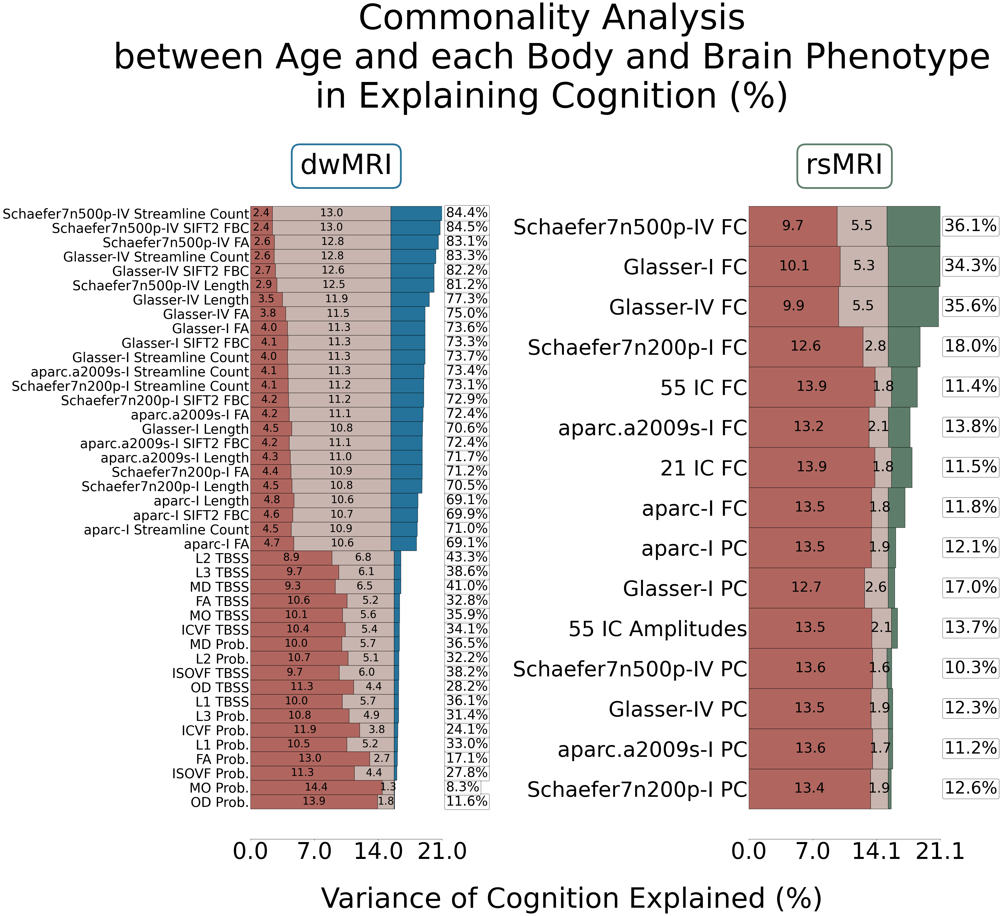

In [ ]:
# Top Row - dwMRI and rsMRI
fig1, axs1 = plt.subplots(1, 2, figsize=(40, 40))
plot_order_fig1 = ['dwMRI', 'rsMRI']

for idx, group_name in enumerate(plot_order_fig1):
    modality_list = modality_groups[group_name]
    ax = axs1[idx]
    
    # Filter data
    group_data = df_individual[df_individual['Modality'].isin(modality_list)].copy()
    
    # Sort by unique age variance
    group_data = group_data.sort_values('Unique variance: brain/body', ascending=True)
    
    # Extract data for plotting
    y_labels = group_data['Modality'].values
    y_labels = [label.replace('Full Correlation', 'FC').replace('Partial Correlation', 'PC').replace('Probabilistic', 'Prob.') for label in y_labels]
    
    # Apply dictionary
    rename_dict = {'Bone Densitometry (of heel)': 'Bone densitometry (heel)',
                   'Abdominal Organ Composition by MRI': 'Abdominal organ composition (MRI)',
                   'Abdominal Composition by MRI': 'Abdominal composition (MRI)',
                   'Body Composition by DXA': 'Body composition (DXA)', 'Abdominal composition by MRI':
                   'Abdominal Composition (MRI)',
                   'Bone Size, Mineral and Density by DXA': 'BMD (DXA)',
                   'Body Composition by Impedance': 'Body composition (impedance)' }
    y_labels = [rename_dict.get(lbl, lbl) for lbl in y_labels]

    y1 = group_data['Unique variance: age'].values*100
    y2 = group_data['Common variance'].values*100
    y3 = group_data['Unique variance: brain/body'].values*100
    
    # Calculate percentages for annotations
    total = y1 + y2 + y3
    perc_u_age = (y1 / total * 100)
    perc_common = (y2 / total * 100)
    perc_u_brain_body = (y3 / total * 100)
    marginal_u_age = group_data['Unique variance: age'].values
    marginal_common = group_data['Common variance'].values
    marginal_u_brain_body = group_data['Unique variance: brain/body'].values
    
    # Get the proportion of g-age explained by brain/body
    prop_age_exp_by_brain_body = group_data['g-age explained by brain/body'].values
    
    bar_height = 1
    
    # Create stacked horizontal bars
    ax.barh(y_labels, y1, height=bar_height, color=color_unique_age, alpha=0.9, edgecolor='black', linewidth=0.9)
    ax.barh(y_labels, y2, height=bar_height, left=y1, color=color_common, alpha=0.9, edgecolor='black', linewidth=0.9)
    ax.barh(y_labels, y3, height=bar_height, left=y1+y2, color=modality_colors[group_name], alpha=0.9, edgecolor='black', linewidth=0.9)
    
    # Add percentage annotations on each segment with font size dictionary
    bar_annot_font_sizes = {
        'dwMRI': 30,
        'rsMRI': 40,
        'sMRI': 30,
        'Body': 30}
    
    # Adjust thresholds
    for i, (u_age, common, u_brain_body) in enumerate(zip(y1, y2, y3)):
        if u_age > 0.001:
            ax.text(u_age/2, i, f'{u_age:.1f}', ha='center', va='center',
                color='black', fontsize=bar_annot_font_sizes[group_name])
        if common > 0.001:
            ax.text(u_age + common / 2, i, f'{common:.1f}', ha='center', va='center',
                color='black', fontsize=bar_annot_font_sizes[group_name])
        if u_brain_body:
            pass #> 0.001:
            #ax.text(u_age + common + u_brain_body/2, i, f'{m_u_brain_body:.2f}', ha='center', va='center', color='black', fontsize=bar_annot_font_sizes[group_name])
    
    # Annotations
    bbox_font_sizes = {
        'dwMRI': 38, 
        'rsMRI': 48,
        'sMRI': 40,
        'Body': 40}
    
    for i, prop_value in enumerate(prop_age_exp_by_brain_body):
        prop_text = f'{prop_value:.1f}%'
        # Position the text to the right of the plot
        # transform=ax.get_yaxis_transform() to position relative to y-axis
        ax.text(1.02, i, prop_text, ha='left', va='center',  
                fontsize=bbox_font_sizes[group_name], transform=ax.get_yaxis_transform(), 
                color='black', bbox=dict(boxstyle="round,pad=0.1", facecolor='white', alpha=0.7))
    
    # Format the subplot
    title_color = modality_colors[group_name]
    ax.set_title(group_name,
             fontsize=80, y=1,
             bbox=dict(facecolor='white', alpha=0.9,
                       edgecolor=title_color, linewidth=5,
                       boxstyle='round,pad=0.3'))
    y_labelsize_dict = {
        'dwMRI': 38, 
        'rsMRI': 60,
        'sMRI': 60,
        'Body': 60}

    ax.tick_params(axis='y', labelsize=y_labelsize_dict[group_name], length=0)
    ax.tick_params(axis='x', labelsize=65)
    ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    
    # Set x-axis limit
    max_total = max(y1 + y2 + y3)
    ax.set_xlim(0, max_total)
    val1 = max_total / 3
    val2 = 2 * max_total / 3
    ax.xaxis.set_major_locator(mticker.FixedLocator([0, val1, val2, max_total]))

    # Remove spines
    for spine in ['top', 'right', 'left']:
        ax.spines[spine].set_visible(False)

# Add common x axis label
fig1.text(0.57, 0.08, 'Variance of Cognition Explained (%)',
         ha='center', fontsize=80)

# Add common title
fig1.suptitle('Commonality Analysis\nbetween Age and each Body and Brain Phenotype\nin Explaining Cognition (%)', 
             fontsize=100, y=0.98, x=0.55)

# Adjust layout
plt.tight_layout(rect=[0, 0.12, 1, 0.95])
plt.subplots_adjust(wspace=1.6, hspace=0.2)

# transform
save_fig(['png', 'svg'], os.path.join(fig_path, 'Fig7_part1_dwMRI_rsMRI_barplots'))
plt.show()

## Figure 7b

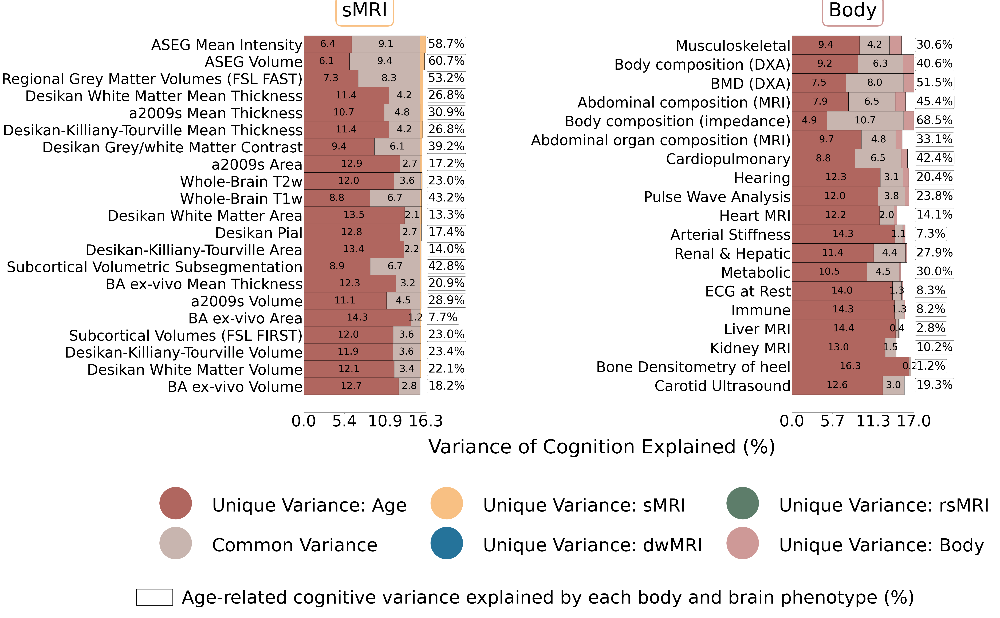

In [ ]:
# Bottom Row - sMRI and Body
fig2, axs2 = plt.subplots(1, 2, figsize=(55, 30))
axs2 = axs2.flatten()
plot_order_fig2 = ['sMRI', 'Body']

for idx, group_name in enumerate(plot_order_fig2):
    modality_list = modality_groups[group_name]
    ax = axs2[idx]
    
    # Filter data
    group_data = df_individual[df_individual['Modality'].isin(modality_list)].copy()
    
    # Sort by unique age variance
    group_data = group_data.sort_values('Unique variance: brain/body', ascending=True)
    
    # Extract data for plotting
    y_labels = group_data['Modality'].values
    y_labels = [label.replace('Full Correlation', 'FC').replace('Partial Correlation', 'PC').replace('Probabilistic', 'Prob.') for label in y_labels]
    
    # Apply dictionary
    rename_dict = {'Bone Densitometry (of heel)': 'Bone densitometry (heel)',
                   'Abdominal Organ Composition by MRI': 'Abdominal organ composition (MRI)',
                   'Abdominal Composition by MRI': 'Abdominal composition (MRI)',
                   'Body Composition by DXA': 'Body composition (DXA)', 'Abdominal composition by MRI':
                   'Abdominal Composition (MRI)',
                   'Bone Size, Mineral and Density by DXA': 'BMD (DXA)',
                   'Body Composition by Impedance': 'Body composition (impedance)',
                   'Desikan Grey/white Matter Contrast': 'Desikan Grey/White Matter Contrast',
                   'Pulse Wave Analysis' : 'Pulse wave analysis',
                   'Arterial Stiffness' : 'Arterial stiffness',
                   'Renal & Hepatic' : 'Renal & hepatic',
                   'ECG at Rest' : 'ECG at rest',
                   'Bone Densitometry of heel' : 'Bone densitometry of heel',
                   'Carotid Ultrasound' : 'Carotid ultrasound'}
    
    y_labels = [rename_dict.get(lbl, lbl) for lbl in y_labels]

    y1 = group_data['Unique variance: age'].values*100
    y2 = group_data['Common variance'].values*100
    y3 = group_data['Unique variance: brain/body'].values*100
    
    # Calculate percentages for annotations
    total = y1 + y2 + y3
    perc_u_age = (y1 / total * 100)
    perc_common = (y2 / total * 100)
    perc_u_brain_body = (y3 / total * 100)
    
    # Get the proportion of g-age explained by brain/body
    prop_age_exp_by_brain_body = group_data['g-age explained by brain/body'].values
    
    bar_height = 1
    
    # Create stacked horizontal bars
    ax.barh(y_labels, y1, height=bar_height, color=color_unique_age, alpha=0.9, edgecolor='black', linewidth=0.9)
    ax.barh(y_labels, y2, height=bar_height, left=y1, color=color_common, alpha=0.9, edgecolor='black', linewidth=0.9)
    ax.barh(y_labels, y3, height=bar_height, left=y1+y2, color=modality_colors[group_name], alpha=0.9, edgecolor='black', linewidth=0.9)
    
    # Add percentage annotations on each segment with font size dictionary
    bar_annot_font_sizes = {
        'dwMRI': 30,
        'rsMRI': 40,
        'sMRI': 40,
        'Body': 40}
    
    # Adjust thresholds
    for i, (u_age, common, u_brain_body) in enumerate(zip(y1, y2, y3)):
        if u_age > 0.001:
            ax.text(u_age/2, i, f'{u_age:.1f}', ha='center', va='center',
                color='black', fontsize=bar_annot_font_sizes[group_name])
        if common > 0.001:
            ax.text(u_age + common/2, i, f'{common:.1f}', ha='center', va='center',
                color='black', fontsize=bar_annot_font_sizes[group_name])
        if u_brain_body:
            pass #> 0.001:
            #ax.text(u_age + common + u_brain_body/2, i, f'{m_u_brain_body:.2f}', ha='center', va='center', color='black', fontsize=bar_annot_font_sizes[group_name])
    
    # Annotations
    bbox_font_sizes = {
        'dwMRI': 38, 
        'rsMRI': 48,
        'sMRI': 48,
        'Body': 48}

    
    for i, prop_value in enumerate(prop_age_exp_by_brain_body):
        prop_text = f'{prop_value:.1f}%'
        # Position the text to the right of the plot
        # transform=ax.get_yaxis_transform() to position relative to y-axis
        ax.text(1.02, i, prop_text, ha='left', va='center',  
                fontsize=bbox_font_sizes[group_name], transform=ax.get_yaxis_transform(), 
                color='black', bbox=dict(boxstyle="round,pad=0.1", facecolor='white', alpha=0.7))
    
    # Format the subplot
    title_color = modality_colors[group_name]  # pick edge color from dict
    ax.set_title(group_name,
             fontsize=80, y=1,
             bbox=dict(facecolor='white', alpha=0.9,
                       edgecolor=title_color, linewidth=5,
                       boxstyle='round,pad=0.3'))
    y_labelsize_dict = {
        'dwMRI': 38, 
        'rsMRI': 60,
        'sMRI': 60,
        'Body': 60}
     
    ax.tick_params(axis='y', labelsize=y_labelsize_dict[group_name], length=0)
    ax.tick_params(axis='x', labelsize=65)
    ax.xaxis.set_major_formatter(plt.FormatStrFormatter('%.1f'))
    
    # Set x-axis limit - extend slightly to accommodate the right-side annotations
    max_total = max(y1 + y2 + y3)
    ax.set_xlim(0, max_total)
    val1 = max_total / 3
    val2 = 2 * max_total / 3
    ax.xaxis.set_major_locator(mticker.FixedLocator([0, val1, val2, max_total]))

    # Remove spines
    for spine in ['top', 'right', 'left']:
        ax.spines[spine].set_visible(False)

# Add common x axis label
fig2.text(0.63, 0.08, 'Variance of Cognition Explained (%)',
         ha='center', fontsize=80)

# Add circle legend
legend_elements_circles = [
    plt.Circle((0,0), 0.5, facecolor=color_unique_age, alpha=0.9, label='Unique Variance: Age'),
    plt.Circle((0,0), 0.5, facecolor=color_common, alpha=0.9, label='Common Variance'),
    plt.Circle((0,0), 0.5, facecolor=modality_colors['sMRI'], alpha=0.9, label='Unique Variance: sMRI'),
    plt.Circle((0,0), 0.5, facecolor=modality_colors['dwMRI'], alpha=0.9, label='Unique Variance: dwMRI'),
    plt.Circle((0,0), 0.5, facecolor=modality_colors['rsMRI'], alpha=0.9, label='Unique Variance: rsMRI'),
    plt.Circle((0,0), 0.5, facecolor=modality_colors['Body'], alpha=0.9, label='Unique Variance: Body'),
]

leg2_top = fig2.legend(handles=legend_elements_circles,
                       loc='lower center', ncol=3,
                       fontsize=75, frameon=False, fancybox=False,
                       bbox_to_anchor=(0.6, -0.15),  # Higher
                       handler_map={plt.Circle: HandlerPatch(patch_func=make_circle_legend)},
                       handletextpad=1.0, handleheight=1.0,
                       columnspacing=1.2, labelspacing=1.2, borderpad=0.5)

# Add rectangle legend
legend_element_rectangle = [
    plt.Rectangle((0,0), 1, 1, facecolor='none', edgecolor='black', lw=2, 
                  label='Age-related cognitive variance explained by each body and brain phenotype (%)')
]

leg2_bottom = fig2.legend(handles=legend_element_rectangle,
                          loc='lower center', ncol=1,
                          fontsize=75, frameon=False, fancybox=False,
                          bbox_to_anchor=(0.55, -0.25),  # Lower than circles
                          handletextpad=0.5, handleheight=1.0,
                          columnspacing=1.2, labelspacing=1.2, borderpad=0.5)

# Adjust layout
plt.tight_layout(rect=[0, 0.12, 1, 0.95])
plt.subplots_adjust(wspace=3, hspace=0.2)

# Save
save_fig(['png', 'svg'], os.path.join(fig_path, 'Fig7_part2_sMRI_Body_barplots'))
plt.show()